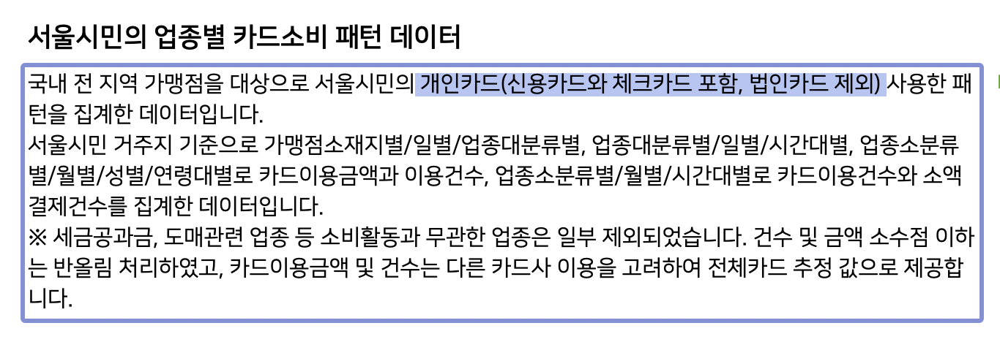

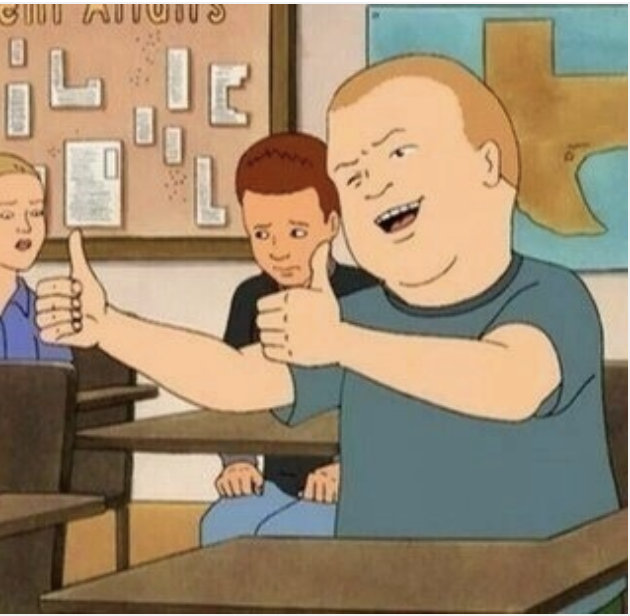

# 목차
1. 데이터 불러오기:( 
2. 데이터 확인하기:)
3. Nan만 추출요!  
4. 지역별 분리~~
5. Over 백만, 고!  
6. 건 금액췍하자요  
7. Nan 처리하이!
8. 암살 실행하마  
9. 서울 실패했스ㅠㅠ  
10. etc. 전처리!! 및 시각화 준비  
11. 서울 시각 하라우  
12. Missing이라구 서울 버전
13. 순수 서울 했다요 시각화  
14. 인천 시각이다요  
15. 경기 시각이요  
16. 그 외 데이터들 관련성 확인
17. 인지해야할 코드 모음
18. 정리
19. 결론

!pip install koreanize-matplotlib
import koreanize_matplotlib

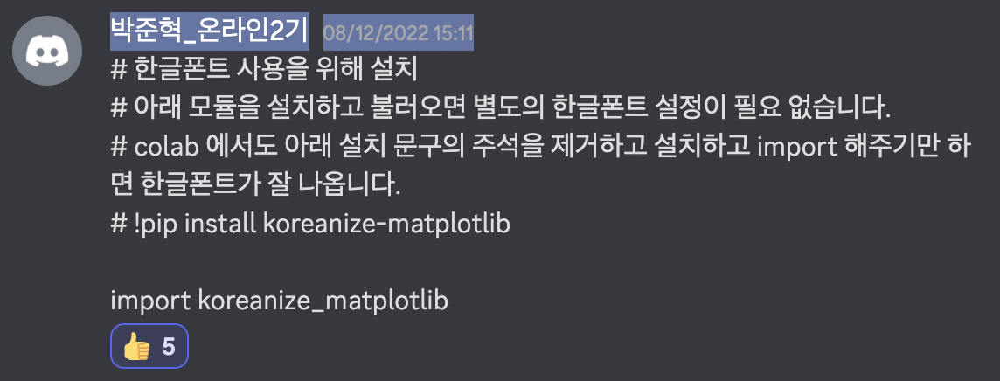

역시 준혁님 최고다

24시간 후...

plt.rc('font', family='NanumGothic')

효린님 최고당~

# 1. 데이터 불러오기

In [1]:
import numpy as np
import pandas as pd
import missingno as msno

import matplotlib.pyplot as plt

import seaborn as sns
sns.set(style= "whitegrid")

import warnings
warnings.filterwarnings("ignore")

In [9]:
plt.rc('font', family='NanumGothic')

初め！

In [2]:
place_df = pd.read_csv("일별소비지역.csv", encoding = "cp949")
gender_df = pd.read_csv("성별연령대별.csv", encoding = "cp949")
day_df = pd.read_csv("일별시간대.csv", encoding = "cp949")
hour_df = pd.read_csv("시간대별소액.csv", encoding = "cp949")
pattern_df = pd.read_csv("카드소비.csv", encoding = "cp949")

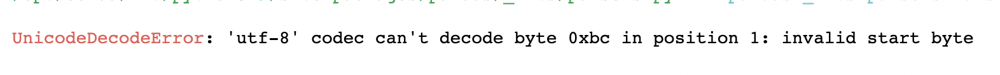  
https://zephyrus1111.tistory.com/39

진표님 감사드립니다.

# 2. 데이터 확인하기

In [3]:
place_df.shape, gender_df.shape, day_df.shape, hour_df.shape, pattern_df.shape

((500, 7), (500, 7), (500, 6), (500, 6), (75, 4))

In [4]:
print(place_df.columns)
print()
print(gender_df.columns)
print()
print(day_df.columns)
print()
print(hour_df.columns)
print()
print(pattern_df.columns)

Index(['가맹점주소광역시도(SIDO)', '가맹점주소시군구(SGG)', '업종대분류(UPJONG_CLASS1)', '기준일자(YMD)',
       '고객주소집계구별(TOT_REG_CD)', '카드이용금액계(AMT_CORR)', '카드이용건수계(USECT_CORR)'],
      dtype='object')

Index(['서울시민업종코드(UPJONG_CD)', '기준년월(YM)', '고객주소블록코드(BLOCK_CD)', '성별(GEDNER)',
       '연령대별(AGE)', '카드이용금액계(AMT_CORR)', '카드이용건수계(USECT_CORR)'],
      dtype='object')

Index(['업종대분류(UPJONG_CLASS1)', '기준일자(YMD)', '시간대구간(TIME)',
       '고객주소집계구별(TOT_REG_CD)', '카드이용금액계(AMT_CORR)', '카드이용건수계(USECT_CORR)'],
      dtype='object')

Index(['서울시민업종코드(UPJONG_CD)', '기준년월(YM)', '시간대구간(TIME)', '고객주소블록코드(BLOCK_CD)',
       '카드이용금액계(AMT_CORR)', '소액결제건수(MICRO_PYM)'],
      dtype='object')

Index(['업종코드(UPJONG_CD)', '대분류(CLASS1)', '중분류(CLASS2)', '소분류(CLASS3)'], dtype='object')


In [5]:
place_df.head(15)

,가맹점주소광역시도(SIDO),가맹점주소시군구(SGG),업종대분류(UPJONG_CLASS1),기준일자(YMD),고객주소집계구별(TOT_REG_CD),카드이용금액계(AMT_CORR),카드이용건수계(USECT_CORR)
0,서울,강남구,전자상거래,20201021,1123077020119,251500,25
1,서울,관악구,요식/유흥,20170312,1112052010107,158445,20
2,서울,마포구,주유,20161205,1113068050004,8048,15
3,서울,동작구,의료,20201210,1105066020601,22635,5
4,서울,NaN,가정생활/서비스,20210216,1117052020001,65390,10
5,경기,마포구,유통,20200319,1108060020010,20120,25
6,인천,종로구,요식/유흥,20181123,1108058020503,110409,5
7,경기,송파구,요식/유흥,20160418,1112058010033,160457,50
8,경기,용인시,미용,20201002,1113074020002,804800,5
9,서울,중구,유통,20170405,1119076020602,182710,15


In [6]:
place_df.info()
#  500 entries 7 columns int64(4), object(3)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 7 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   가맹점주소광역시도(SIDO)       500 non-null    object
 1   가맹점주소시군구(SGG)         442 non-null    object
 2   업종대분류(UPJONG_CLASS1)  500 non-null    object
 3   기준일자(YMD)             500 non-null    int64 
 4   고객주소집계구별(TOT_REG_CD)  500 non-null    int64 
 5   카드이용금액계(AMT_CORR)     500 non-null    int64 
 6   카드이용건수계(USECT_CORR)   500 non-null    int64 
dtypes: int64(4), object(3)
memory usage: 27.5+ KB


In [7]:
place_df.isnull().sum()

가맹점주소광역시도(SIDO)          0
가맹점주소시군구(SGG)           58
업종대분류(UPJONG_CLASS1)     0
기준일자(YMD)                0
고객주소집계구별(TOT_REG_CD)     0
카드이용금액계(AMT_CORR)        0
카드이용건수계(USECT_CORR)      0
dtype: int64

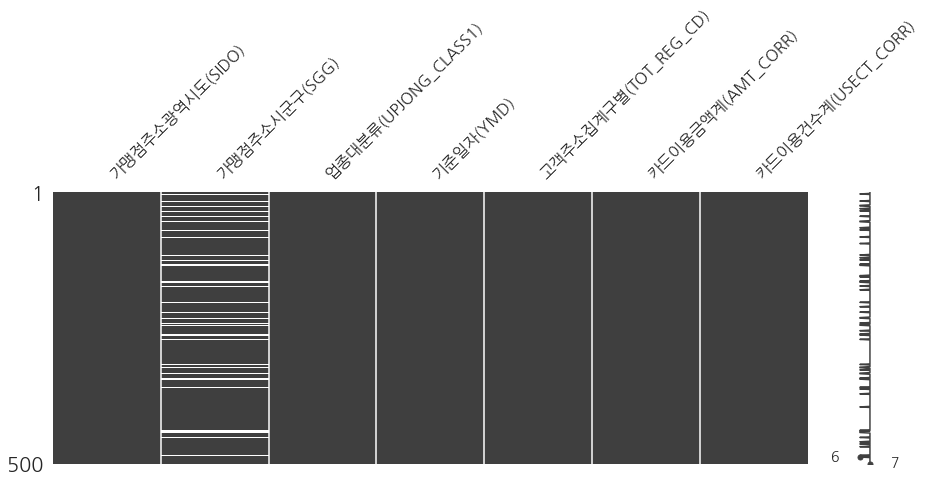

In [10]:
msno.matrix(place_df, figsize= (15, 5));

In [11]:
place_df["가맹점주소시군구(SGG)"].nunique()

53

In [12]:
place_df["가맹점주소시군구(SGG)"].unique()

array(['강남구', '관악구', '마포구', '동작구', nan, '종로구', '송파구', '용인시', '중구', '용산구',
       '성북구', '노원구', '서초구', '강서구', '중랑구', '화성시', '남양주시', '가평군', '서대문구',
       '광진구', '부천시', '양천구', '파주시', '영등포구', '수원시', '구리시', '성남시', '도봉구',
       '광주시', '은평구', '옹진군', '구로구', '시흥시', '동대문구', '강동구', '안산시', '고양시',
       '김포시', '평택시', '성동구', '강북구', '이천시', '연수구', '의정부시', '양주시', '남동구',
       '금천구', '부평구', '오산시', '강화군', '하남시', '광명시', '안양시', '양평군'],
      dtype=object)

In [13]:
len(place_df["가맹점주소시군구(SGG)"].unique())

54

# 3. NaN 데이터만 추출

In [14]:
place_nan = place_df[place_df.isna().any(axis= 1)]

In [15]:
place_nan

,가맹점주소광역시도(SIDO),가맹점주소시군구(SGG),업종대분류(UPJONG_CLASS1),기준일자(YMD),고객주소집계구별(TOT_REG_CD),카드이용금액계(AMT_CORR),카드이용건수계(USECT_CORR)
4,서울,NaN,가정생활/서비스,20210216,1117052020001,65390,10
17,강원,NaN,여행/교통,20180602,1112059030006,627437,5
25,서울,NaN,유통,20180613,1114068010009,179571,5
26,서울,NaN,유통,20190321,1120056020006,28671,40
31,서울,NaN,요식/유흥,20210414,1108062020701,22635,5
35,서울,NaN,요식/유흥,20180420,1119061030002,22132,20
45,서울,NaN,전자상거래,20170222,1117052020306,34657,5
54,서울,NaN,의료,20200508,1125073010003,80480,10
55,서울,NaN,의료,20160223,1105060030001,166191,5
66,서울,NaN,전자상거래,20190605,1111069010008,176050,5


In [16]:
place_nan["가맹점주소광역시도(SIDO)"].unique()

array(['서울', '강원', '경기', '충남', '인천', '경북', '광주', '전북', '경남', '대구', '세종'],
      dtype=object)

In [17]:
seoul_nan = place_nan.loc[place_nan["가맹점주소광역시도(SIDO)"] == "서울"]
kangwon_nan = place_nan.loc[place_nan["가맹점주소광역시도(SIDO)"] == "강원"]
gyeonggi_nan = place_nan.loc[place_nan["가맹점주소광역시도(SIDO)"] == "경기"]
chungnam_nan = place_nan.loc[place_nan["가맹점주소광역시도(SIDO)"] == "충남"]
incheon_nan = place_nan.loc[place_nan["가맹점주소광역시도(SIDO)"] == "인천"]
gyeongbuk_nan = place_nan.loc[place_nan["가맹점주소광역시도(SIDO)"] == "경북"]
gyeongnam_nan = place_nan.loc[place_nan["가맹점주소광역시도(SIDO)"] == "경남"]
gwangju_nan = place_nan.loc[place_nan["가맹점주소광역시도(SIDO)"] == "광주"]
jeolbuk_nan = place_nan.loc[place_nan["가맹점주소광역시도(SIDO)"] == "전북"]
daegu_nan = place_nan.loc[place_nan["가맹점주소광역시도(SIDO)"] == "대구"]
sejong_nan = place_nan.loc[place_nan["가맹점주소광역시도(SIDO)"] == "세종"]

In [18]:
citys = [seoul_nan, 
         kangwon_nan, 
         gyeonggi_nan, 
         chungnam_nan, 
         incheon_nan, 
         gyeongbuk_nan, 
         gyeongnam_nan, 
         gwangju_nan, 
         jeolbuk_nan, 
         daegu_nan, 
         sejong_nan]

In [19]:
cis = ["서울", 
       "강원", 
       "경기", 
       "충남", 
       "인천", 
       "경북", 
       "경남", 
       "광주", 
       "전북", 
       "대구", 
       "세종"]

In [20]:
for ci, city in zip(cis , citys):
    print("{}: {}".format(ci , city.shape))

서울: (41, 7)
강원: (3, 7)
경기: (5, 7)
충남: (1, 7)
인천: (2, 7)
경북: (1, 7)
경남: (1, 7)
광주: (1, 7)
전북: (1, 7)
대구: (1, 7)
세종: (1, 7)


# 4. 광역시도별 분리해서 확인

# 서울
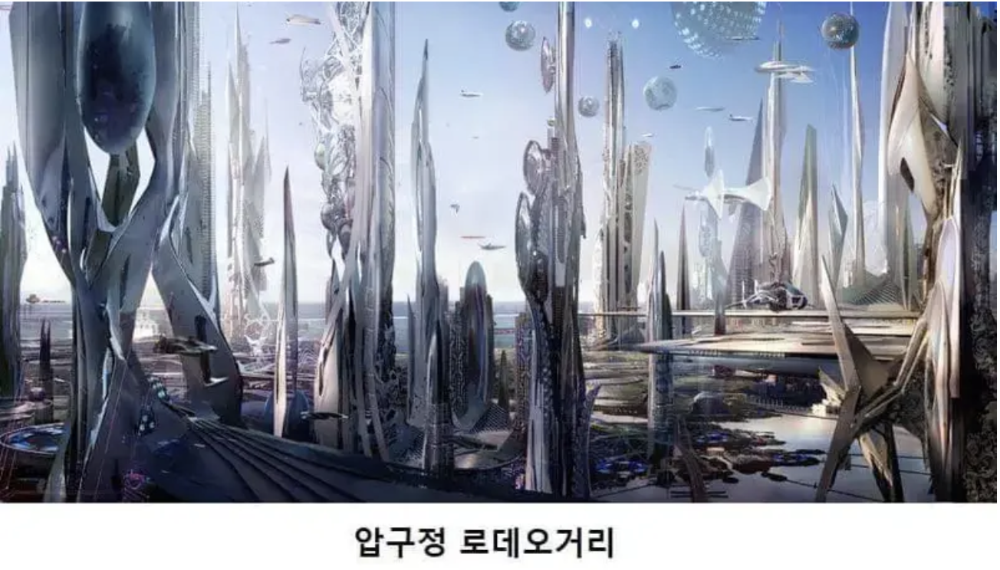

In [21]:
seoul_nan

,가맹점주소광역시도(SIDO),가맹점주소시군구(SGG),업종대분류(UPJONG_CLASS1),기준일자(YMD),고객주소집계구별(TOT_REG_CD),카드이용금액계(AMT_CORR),카드이용건수계(USECT_CORR)
4,서울,NaN,가정생활/서비스,20210216,1117052020001,65390,10
25,서울,NaN,유통,20180613,1114068010009,179571,5
26,서울,NaN,유통,20190321,1120056020006,28671,40
31,서울,NaN,요식/유흥,20210414,1108062020701,22635,5
35,서울,NaN,요식/유흥,20180420,1119061030002,22132,20
45,서울,NaN,전자상거래,20170222,1117052020306,34657,5
54,서울,NaN,의료,20200508,1125073010003,80480,10
55,서울,NaN,의료,20160223,1105060030001,166191,5
66,서울,NaN,전자상거래,20190605,1111069010008,176050,5
83,서울,NaN,요식/유흥,20200404,1115071010309,11569,5


In [22]:
seoul = place_df.loc[place_df["가맹점주소광역시도(SIDO)"] == "서울"]
seoul

,가맹점주소광역시도(SIDO),가맹점주소시군구(SGG),업종대분류(UPJONG_CLASS1),기준일자(YMD),고객주소집계구별(TOT_REG_CD),카드이용금액계(AMT_CORR),카드이용건수계(USECT_CORR)
0,서울,강남구,전자상거래,20201021,1123077020119,251500,25
1,서울,관악구,요식/유흥,20170312,1112052010107,158445,20
2,서울,마포구,주유,20161205,1113068050004,8048,15
3,서울,동작구,의료,20201210,1105066020601,22635,5
4,서울,NaN,가정생활/서비스,20210216,1117052020001,65390,10
...,...,...,...,...,...,...,...
493,서울,구로구,미용,20210428,1124059020102,16599,5
494,서울,중구,주유,20210309,1110054010002,79474,5
495,서울,종로구,가전/가구,20201108,1120055030005,55330,10
497,서울,강남구,유통,20160326,1123064020008,2052240,5


In [23]:
place_df.loc[place_df["가맹점주소광역시도(SIDO)"] == "서울"]["카드이용금액계(AMT_CORR)"].cumsum()
# 362건 105614027

0         251500
1         409945
2         417993
3         440628
4         506018
         ...    
493    103404348
494    103483822
495    103539152
497    105591392
498    105614027
Name: 카드이용금액계(AMT_CORR), Length: 362, dtype: int64

# 경기
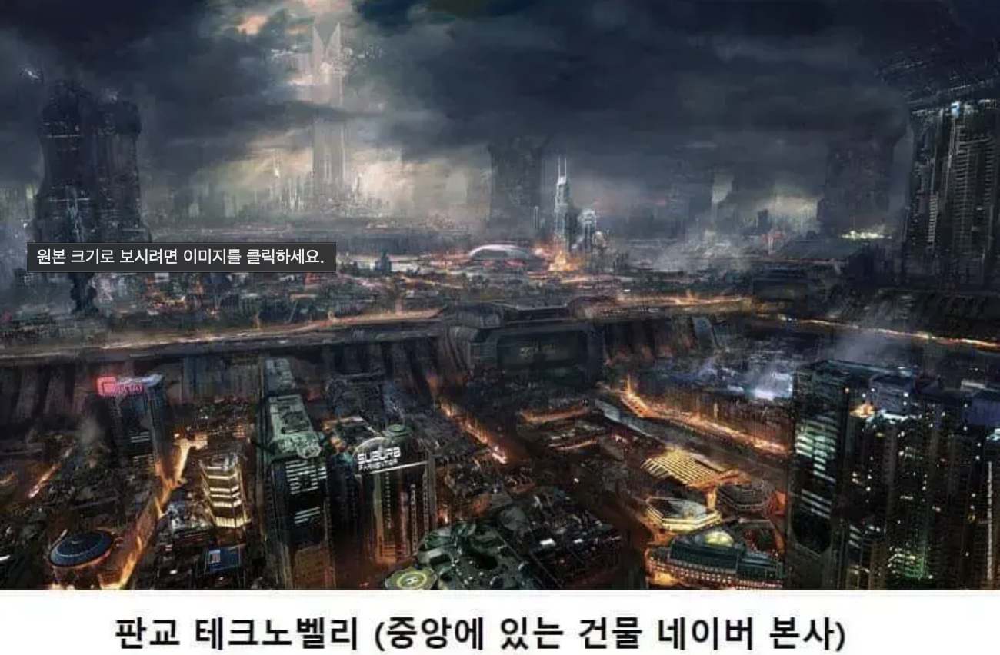

In [24]:
gyeonggi_nan

,가맹점주소광역시도(SIDO),가맹점주소시군구(SGG),업종대분류(UPJONG_CLASS1),기준일자(YMD),고객주소집계구별(TOT_REG_CD),카드이용금액계(AMT_CORR),카드이용건수계(USECT_CORR)
95,경기,NaN,의류/잡화,20180427,1124061010018,30180,5
116,경기,NaN,자동차,20210116,1117054010703,24647,5
156,경기,NaN,요식/유흥,20170614,1115051010003,286207,5
459,경기,NaN,유통,20171202,1122055010101,341990,5
487,경기,NaN,전자상거래,20170308,1122060020701,140840,5


In [25]:
gyeonggi = place_df.loc[place_df["가맹점주소광역시도(SIDO)"] == "경기"]
gyeonggi

,가맹점주소광역시도(SIDO),가맹점주소시군구(SGG),업종대분류(UPJONG_CLASS1),기준일자(YMD),고객주소집계구별(TOT_REG_CD),카드이용금액계(AMT_CORR),카드이용건수계(USECT_CORR)
5,경기,마포구,유통,20200319,1108060020010,20120,25
7,경기,송파구,요식/유흥,20160418,1112058010033,160457,50
8,경기,용인시,미용,20201002,1113074020002,804800,5
33,경기,광진구,요식/유흥,20190523,1119074030001,1069730,5
57,경기,성남시,가정생활/서비스,20180707,1124063020007,532677,20
...,...,...,...,...,...,...,...
479,경기,강서구,요식/유흥,20200206,1125073020006,29174,5
483,경기,송파구,전자상거래,20170703,1123058010501,12575,5
485,경기,용산구,음/식료품,20210408,1117069010010,189812,15
487,경기,NaN,전자상거래,20170308,1122060020701,140840,5


In [26]:
place_df.loc[place_df["가맹점주소광역시도(SIDO)"] == "경기"]["카드이용금액계(AMT_CORR)"].cumsum()
# 72건 40025024

5         20120
7        180577
8        985377
33      2055107
57      2587784
         ...   
479    38867440
483    38880015
485    39069827
487    39210667
491    40025024
Name: 카드이용금액계(AMT_CORR), Length: 72, dtype: int64

# 인천
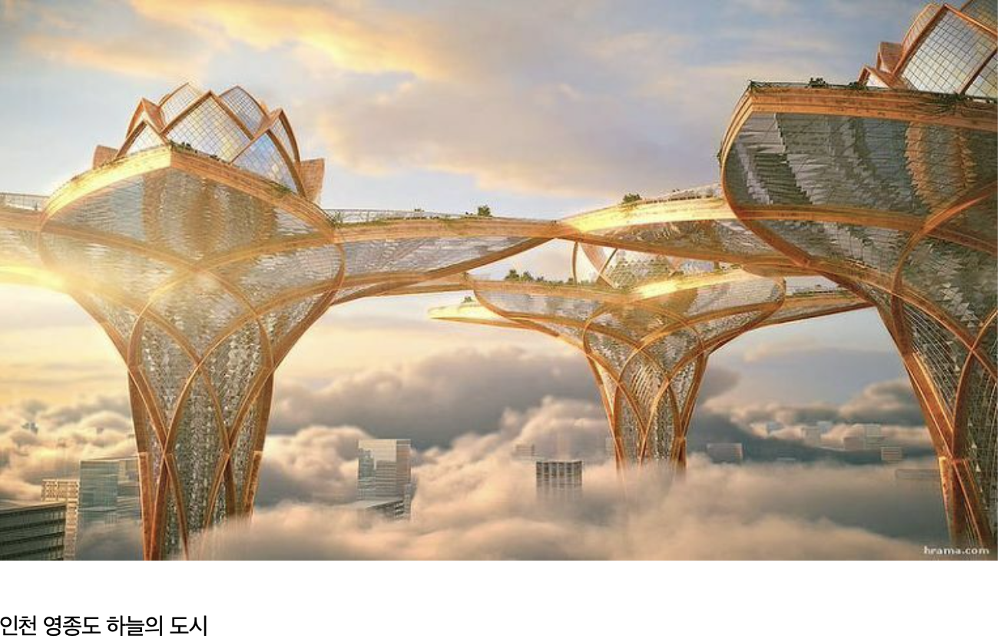

In [27]:
incheon_nan

,가맹점주소광역시도(SIDO),가맹점주소시군구(SGG),업종대분류(UPJONG_CLASS1),기준일자(YMD),고객주소집계구별(TOT_REG_CD),카드이용금액계(AMT_CORR),카드이용건수계(USECT_CORR)
166,인천,NaN,요식/유흥,20170813,1118051050001,384795,5
322,인천,NaN,전자상거래,20160926,1115072030009,188625,5


In [28]:
incheon = place_df.loc[place_df["가맹점주소광역시도(SIDO)"] == "인천"]
incheon

,가맹점주소광역시도(SIDO),가맹점주소시군구(SGG),업종대분류(UPJONG_CLASS1),기준일자(YMD),고객주소집계구별(TOT_REG_CD),카드이용금액계(AMT_CORR),카드이용건수계(USECT_CORR)
6,인천,종로구,요식/유흥,20181123,1108058020503,110409,5
74,인천,구리시,유통,20170116,1120072040106,898936,5
99,인천,관악구,스포츠/문화/레저,20161219,1121071010103,1241303,5
166,인천,NaN,요식/유흥,20170813,1118051050001,384795,5
289,인천,은평구,미용,20200401,1115053020101,518090,5
306,인천,중랑구,요식/유흥,20170423,1119075040005,245062,5
322,인천,NaN,전자상거래,20160926,1115072030009,188625,5
336,인천,하남시,요식/유흥,20190808,1124080030121,258039,40
499,인천,마포구,음/식료품,20210628,1122052030002,667481,116


In [29]:
incheon["업종대분류(UPJONG_CLASS1)"].value_counts()

요식/유흥        4
유통           1
스포츠/문화/레저    1
미용           1
전자상거래        1
음/식료품        1
Name: 업종대분류(UPJONG_CLASS1), dtype: int64

In [30]:
incheon.loc[incheon["업종대분류(UPJONG_CLASS1)"] == "요식/유흥"]

,가맹점주소광역시도(SIDO),가맹점주소시군구(SGG),업종대분류(UPJONG_CLASS1),기준일자(YMD),고객주소집계구별(TOT_REG_CD),카드이용금액계(AMT_CORR),카드이용건수계(USECT_CORR)
6,인천,종로구,요식/유흥,20181123,1108058020503,110409,5
166,인천,NaN,요식/유흥,20170813,1118051050001,384795,5
306,인천,중랑구,요식/유흥,20170423,1119075040005,245062,5
336,인천,하남시,요식/유흥,20190808,1124080030121,258039,40


In [31]:
incheon.loc[incheon["업종대분류(UPJONG_CLASS1)"] == "전자상거래"]

,가맹점주소광역시도(SIDO),가맹점주소시군구(SGG),업종대분류(UPJONG_CLASS1),기준일자(YMD),고객주소집계구별(TOT_REG_CD),카드이용금액계(AMT_CORR),카드이용건수계(USECT_CORR)
322,인천,NaN,전자상거래,20160926,1115072030009,188625,5


In [32]:
place_df.loc[place_df["가맹점주소광역시도(SIDO)"] == "인천"]["카드이용금액계(AMT_CORR)"].cumsum()
# 9건 4512740

6       110409
74     1009345
99     2250648
166    2635443
289    3153533
306    3398595
322    3587220
336    3845259
499    4512740
Name: 카드이용금액계(AMT_CORR), dtype: int64

# 충남
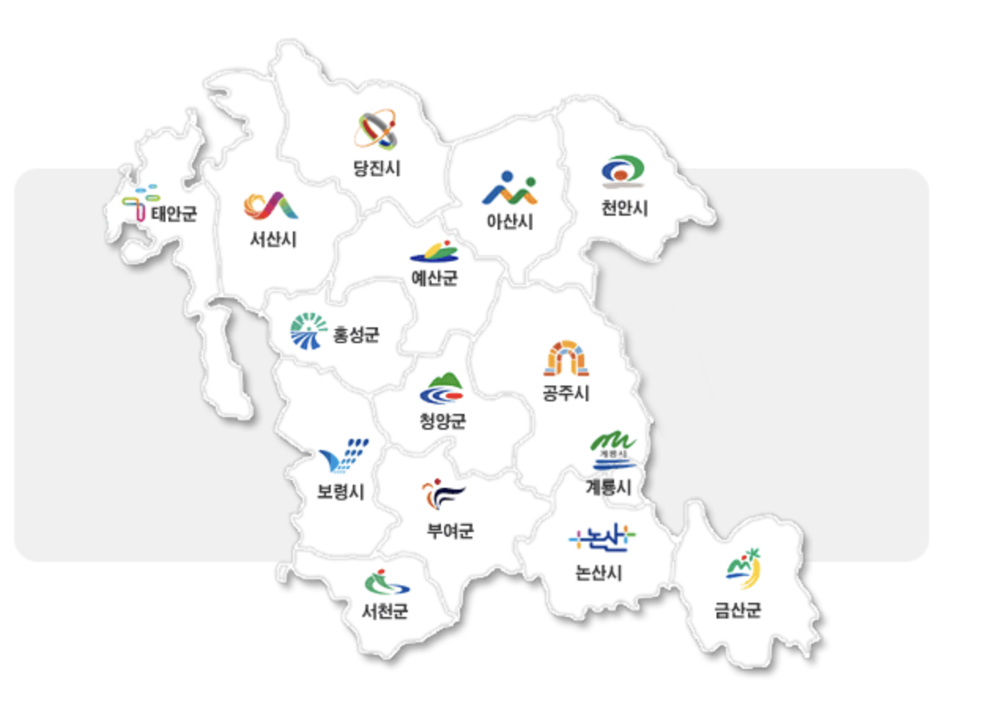

In [33]:
chungnam_nan

,가맹점주소광역시도(SIDO),가맹점주소시군구(SGG),업종대분류(UPJONG_CLASS1),기준일자(YMD),고객주소집계구별(TOT_REG_CD),카드이용금액계(AMT_CORR),카드이용건수계(USECT_CORR)
154,충남,NaN,유통,20200910,1123078040003,83498,5


In [34]:
chungnam = place_df.loc[place_df["가맹점주소광역시도(SIDO)"] == "충남"]

In [35]:
place_df.loc[place_df["가맹점주소광역시도(SIDO)"] == "충남"]["카드이용금액계(AMT_CORR)"].cumsum()
# 5건 482780

77      15845
154     99343
214    120972
226    322172
396    482780
Name: 카드이용금액계(AMT_CORR), dtype: int64

# 경북
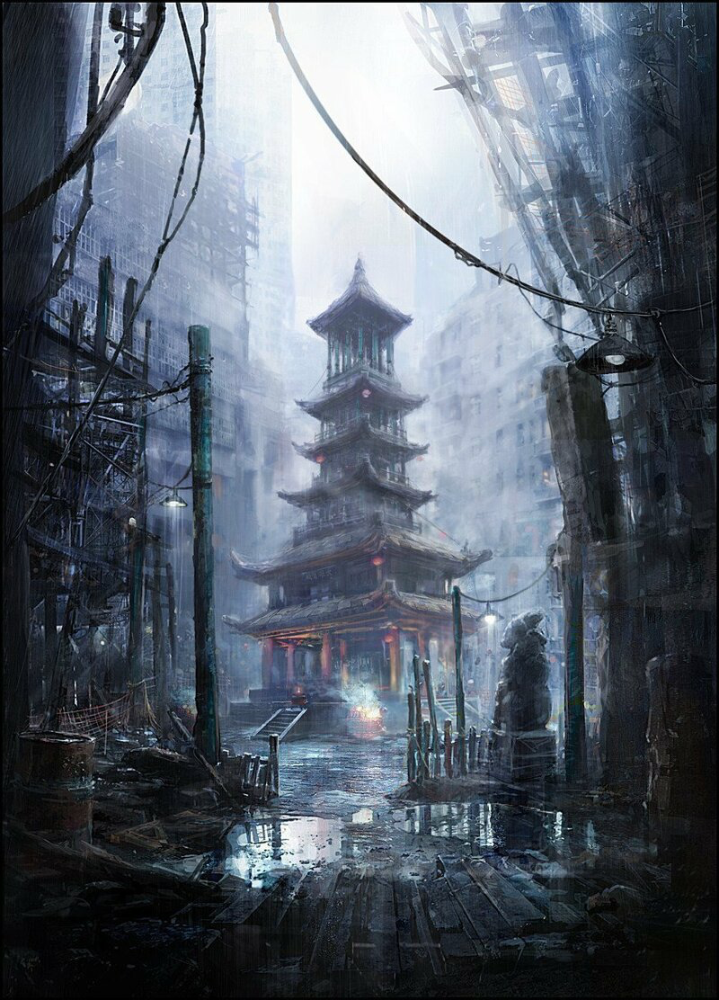

In [36]:
gyeongbuk_nan

,가맹점주소광역시도(SIDO),가맹점주소시군구(SGG),업종대분류(UPJONG_CLASS1),기준일자(YMD),고객주소집계구별(TOT_REG_CD),카드이용금액계(AMT_CORR),카드이용건수계(USECT_CORR)
180,경북,NaN,요식/유흥,20180116,1122051010008,207236,5


In [37]:
gyeongbuk = place_df.loc[place_df["가맹점주소광역시도(SIDO)"] == "경북"]

In [38]:
place_df.loc[place_df["가맹점주소광역시도(SIDO)"] == "경북"]["카드이용금액계(AMT_CORR)"].cumsum()
# 6건 632875

56      15090
105     67905
124    113175
180    320411
392    574426
460    632875
Name: 카드이용금액계(AMT_CORR), dtype: int64

# 경남

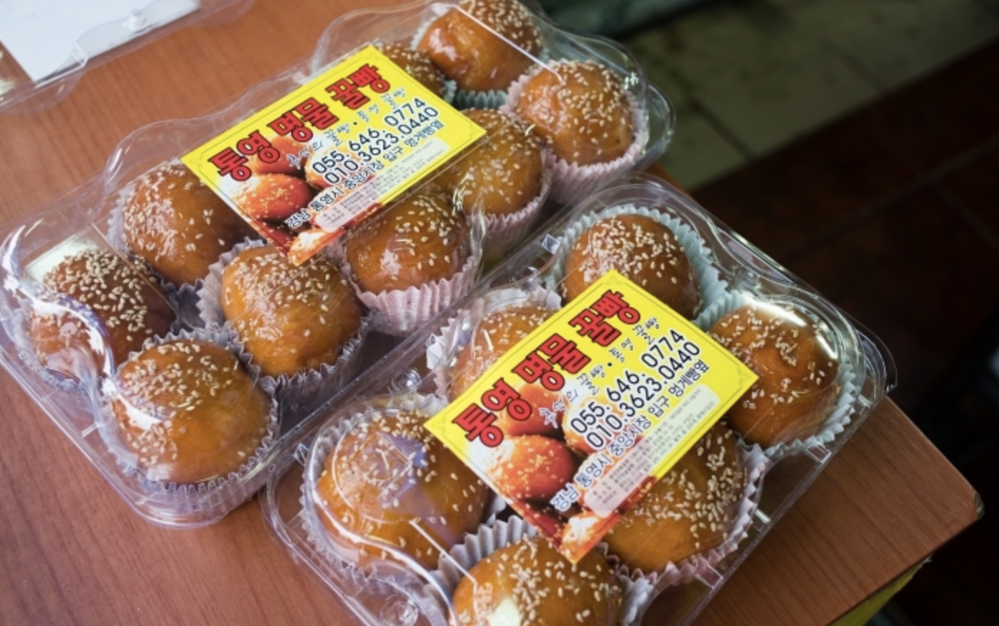

In [39]:
gyeongnam_nan

,가맹점주소광역시도(SIDO),가맹점주소시군구(SGG),업종대분류(UPJONG_CLASS1),기준일자(YMD),고객주소집계구별(TOT_REG_CD),카드이용금액계(AMT_CORR),카드이용건수계(USECT_CORR)
317,경남,NaN,요식/유흥,20180531,1116069030012,182589,5


In [40]:
gyeongnam = place_df.loc[place_df["가맹점주소광역시도(SIDO)"] == "경남"]

In [41]:
place_df.loc[place_df["가맹점주소광역시도(SIDO)"] == "경남"]["카드이용금액계(AMT_CORR)"].cumsum()
# 5건 717932

14     125247
39     193756
317    376345
449    644494
454    717932
Name: 카드이용금액계(AMT_CORR), dtype: int64

# 광주

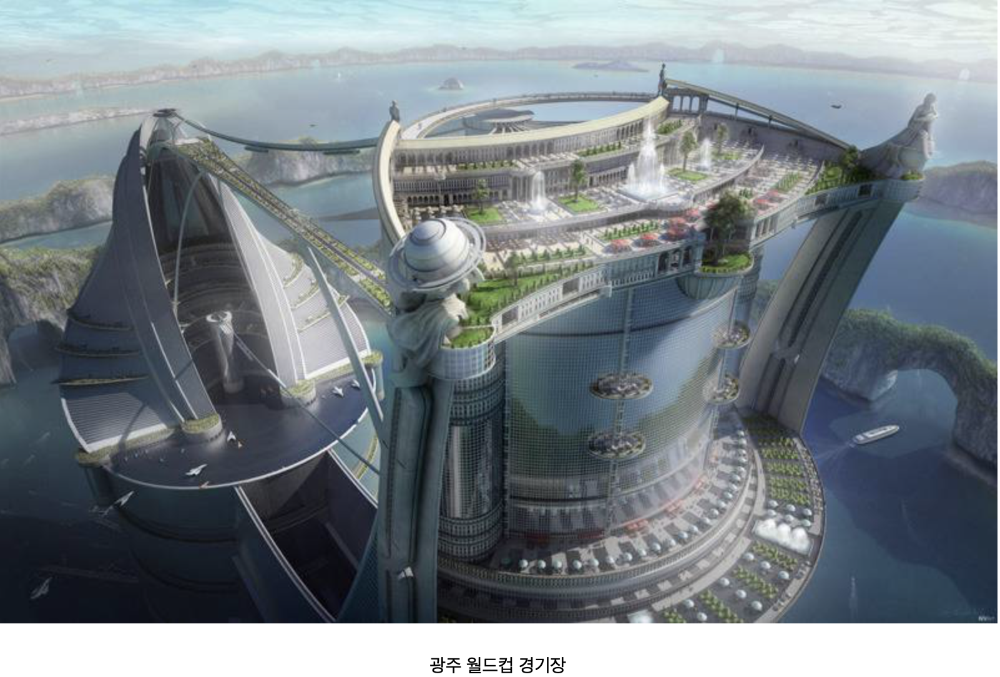

In [42]:
gwangju_nan

,가맹점주소광역시도(SIDO),가맹점주소시군구(SGG),업종대분류(UPJONG_CLASS1),기준일자(YMD),고객주소집계구별(TOT_REG_CD),카드이용금액계(AMT_CORR),카드이용건수계(USECT_CORR)
203,광주,NaN,전자상거래,20201227,1111069010017,90540,5


In [43]:
gwangju = place_df.loc[place_df["가맹점주소광역시도(SIDO)"] == "광주"]

In [44]:
place_df.loc[place_df["가맹점주소광역시도(SIDO)"] == "광주"]["카드이용금액계(AMT_CORR)"].cumsum()
# 2건 115690

36      25150
203    115690
Name: 카드이용금액계(AMT_CORR), dtype: int64

# 전북

In [45]:
jeolbuk_nan

,가맹점주소광역시도(SIDO),가맹점주소시군구(SGG),업종대분류(UPJONG_CLASS1),기준일자(YMD),고객주소집계구별(TOT_REG_CD),카드이용금액계(AMT_CORR),카드이용건수계(USECT_CORR)
271,전북,NaN,요식/유흥,20190205,1111053030602,32293,5


In [46]:
jeolbuk = place_df.loc[place_df["가맹점주소광역시도(SIDO)"] == "전북"]

In [47]:
place_df.loc[place_df["가맹점주소광역시도(SIDO)"] == "전북"]["카드이용금액계(AMT_CORR)"].cumsum()
# 2건 228463

271     32293
428    228463
Name: 카드이용금액계(AMT_CORR), dtype: int64

# 대구

In [48]:
daegu_nan

,가맹점주소광역시도(SIDO),가맹점주소시군구(SGG),업종대분류(UPJONG_CLASS1),기준일자(YMD),고객주소집계구별(TOT_REG_CD),카드이용금액계(AMT_CORR),카드이용건수계(USECT_CORR)
371,대구,NaN,유통,20191103,1124067020008,46779,5


In [49]:
daegu = place_df.loc[place_df["가맹점주소광역시도(SIDO)"] == "대구"]

In [50]:
place_df.loc[place_df["가맹점주소광역시도(SIDO)"] == "대구"]["카드이용금액계(AMT_CORR)"].cumsum()
# 5건 1658391

90       45270
182      76456
237     126756
270    1108612
299    1611612
371    1658391
Name: 카드이용금액계(AMT_CORR), dtype: int64

# 세종

In [51]:
sejong_nan

,가맹점주소광역시도(SIDO),가맹점주소시군구(SGG),업종대분류(UPJONG_CLASS1),기준일자(YMD),고객주소집계구별(TOT_REG_CD),카드이용금액계(AMT_CORR),카드이용건수계(USECT_CORR)
463,세종,NaN,음/식료품,20210408,1111060010007,215837,10


In [52]:
sejong = place_df.loc[place_df["가맹점주소광역시도(SIDO)"] == "세종"]

In [53]:
place_df.loc[place_df["가맹점주소광역시도(SIDO)"] == "세종"]["카드이용금액계(AMT_CORR)"].cumsum()
# 1건 215837

463    215837
Name: 카드이용금액계(AMT_CORR), dtype: int64

# 5. 1백만원, 카드 이용 금액 초과한 광역시도
>서울(362건 105,614,027) -> (nan)41개, 23,198,607  -> 22%  
경기(72건 40,025,024) -> (nan)5개, 823,864 -> 2%  
인천(9건 4,512,740) -> (nan)2개, 573,420 -> 13% 

>>seoul_nan["카드이용금액계(AMT_CORR)"].sum()  
gyeonggi_nan["카드이용금액계(AMT_CORR)"].sum()  
incheon_nan["카드이용금액계(AMT_CORR)"].sum()  
>>>round(23198607 / 105614027 * 100)  
round(823864 / 40025024 * 100)  
round(573420 / 4512740 * 100)

# 6. 건당 금액 확인( 서울, 경기, 인천 )

## 서울 건당 금액

In [54]:
seoul_a = place_df.loc[place_df["가맹점주소광역시도(SIDO)"] == "서울"]["카드이용금액계(AMT_CORR)"].sum()
seoul_u = place_df.loc[place_df["가맹점주소광역시도(SIDO)"] == "서울"]["카드이용건수계(USECT_CORR)"].sum()

#### 결측치 건당 금액
>seoul_nan["카드이용금액계(AMT_CORR)"].sum() / seoul_nan["카드이용건수계(USECT_CORR)"].sum()  

23198607 / 768 = 30,207  

#### 결측치 제외한 건당 금액
>(seoul_a - 23198607) / (seoul_u - 768)   

82415420 / 4100 = 20,101

#### 서울 결측치 건당 금액 평균
30207 / 21696 * 100 = 139% -> 평균 이상

## 경기 건당 금액

In [55]:
gyeonggi_a = place_df.loc[place_df["가맹점주소광역시도(SIDO)"] == "경기"]["카드이용금액계(AMT_CORR)"].sum()
gyeonggi_u = place_df.loc[place_df["가맹점주소광역시도(SIDO)"] == "경기"]["카드이용건수계(USECT_CORR)"].sum()

#### 결측치 건당 금액
>gyeonggi_nan["카드이용금액계(AMT_CORR)"].sum() / gyeonggi_nan["카드이용건수계(USECT_CORR)"].sum()  

823864 / 25 = 32,955  
#### 결측치 제외한 건당 금액
>(gyeonggi_a - 823864) / (gyeonggi_u - 25)  

39201160 / 1099 = 35,670

#### 경기 결측치 건당 금액 평균
32955 / 35609 * 100 = 93% -> 평균 이하

## 인천 건당 금액

In [56]:
incheon_a = place_df.loc[place_df["가맹점주소광역시도(SIDO)"] == "인천"]["카드이용금액계(AMT_CORR)"].sum()
incheon_u = place_df.loc[place_df["가맹점주소광역시도(SIDO)"] == "인천"]["카드이용건수계(USECT_CORR)"].sum()

#### 결측치 건당 금액
>incheon_nan["카드이용금액계(AMT_CORR)"].sum() / incheon_nan["카드이용건수계(USECT_CORR)"].sum()  

573420 / 10  = 57,342
#### 결측치 제외한 건당 금액
>(incheon_a - 573420) / (incheon_u - 10)    

3939320 / 181 = 21,764

#### 인천 결측치 건당 금액 평균
57342 / 23627 * 100 = 243% -> 평균 이상

# 7. Missing Data 계획
1. 서울에서 가장 많은 지역으로 결측치 채우기 (내 멋대로의 시선으로 데이터를 바라봐야하는데 양심에 찔려서 못함 혹여나 이로 인해서 피해자 발생할 수도......)  
~~2. 업종별 관계~~  
~~3. 년도 관계~~  
~~4. "건수" 과 "이용 금액"를 비교하여 "건당 이용금액 확인"~~   
5. 년도별 카드 이용 건수 -> 코로나 (시간상 불가능)  
~~6. 서울 전체 금액에서 서울 nan 금액 차지하는 비율~~  

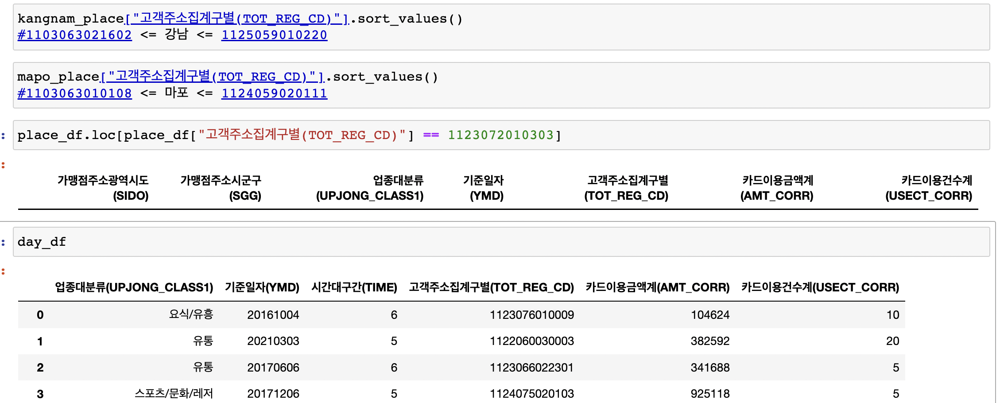

day_df 와 place_df의 공통부분인 "고객주소집계구별(TOT_REG_CD)"을 보고  
"가맹점주소시군구(SGG)"의 null 값을 예측 가능할거라는 생각에서 시작하였으나 관계가 없었다.  
> "고객주소집계구별(TOT_REG_CD)" 열을 drop 예정.

# 8. Dropping 및 Filling ....
~~# how to fill or drop missing dataes~~  
~~1. 경기도 missing data drop 예정~~  
~~2. 인천 missing data 전자상거래 drop 예정 -> 변수가 커서 알 수 없다.~~  
~~3. 인천 166 index, 기준일자 비슷한 시기였던 중량구로 채울 예정	~~  
~~4. 서울, 경기, 인천 제외한 지역 drop 예정~~  
~~5. "고객주소집계구별(TOT_REG_CD)" 열을 drop 예정.~~

In [57]:
place_df.drop(columns= "고객주소집계구별(TOT_REG_CD)", inplace= True)

In [58]:
place_df.columns = ["시도", "시군구", "업종", "일자", "금액", "건"]

In [59]:
place_df.loc[166] = place_df.loc[166].fillna("중량구")
place_df.loc[[166]]

,시도,시군구,업종,일자,금액,건
166,인천,중량구,요식/유흥,20170813,384795,5


In [60]:
place_df.iloc[322]

시도           인천
시군구         NaN
업종        전자상거래
일자     20160926
금액       188625
건             5
Name: 322, dtype: object

In [61]:
place_df = place_df.drop(322)
# 499 entries

In [62]:
place_df.iloc[320: 325]
#index가 밀리지는 않는다.

,시도,시군구,업종,일자,금액,건
320,서울,성북구,가정생활/서비스,20180417,48037,5
321,서울,성남시,전자상거래,20190804,240434,5
323,서울,NaN,주유,20200102,1140452,5
324,부산,용인시,가전/가구,20171008,60360,5
325,서울,고양시,의료,20190423,72432,5


In [63]:
place_df[(place_df['시도'] == "경기") & (place_df['시군구'].isnull() == True)]

,시도,시군구,업종,일자,금액,건
95,경기,NaN,의류/잡화,20180427,30180,5
116,경기,NaN,자동차,20210116,24647,5
156,경기,NaN,요식/유흥,20170614,286207,5
459,경기,NaN,유통,20171202,341990,5
487,경기,NaN,전자상거래,20170308,140840,5


In [64]:
place_df = place_df.drop(index= [95, 116, 156, 459, 487])
# 494 entries

### 그외 지역 확인 후 암살 예정
place_df[(place_df['시도'] == "세종") & (place_df['시군구'].isnull() == True)]
>세종463 대구371 전북271 광주203 경남317 경북180 충남154 강원17 70 255

In [65]:
place_df = place_df.drop(index= [463, 371, 271, 203, 317, 180, 154, 17, 70, 255])
# 484 entries

In [66]:
place_df['시도'].unique()

array(['서울', '경기', '인천', '제주', '경남', '대전', '광주', '부산', '경북', '충남', '충북',
       '대구', '강원', '전남', '전북'], dtype=object)

# 9. 서울 결측치 채우기 실패 사례

1. seoul_nan["업종대분류(UPJONG_CLASS1)"].value_counts()   
-> 결측치와 업종과 관련이 있을 것 같아 시도 
> seoul[(seoul["업종대분류(UPJONG_CLASS1)"] == "주유")]  
->개수가 너무 많아 일일이 시간내에 확인 불가능하다고 판단

2. seoul["가맹점주소시군구(SGG)"].value_counts()  
-> 시군구를 통해서 확인해보려고 시도  
>>seoul[(seoul["업종대분류(UPJONG_CLASS1)"] == "유통") & (seoul["가맹점주소시군구(SGG)"] == "종로구")]  
->개수가 너무 많아 일일이 시간내에 확인 불가능하다고 판단

3. seoul[(seoul["업종대분류(UPJONG_CLASS1)"] == "유통") & (seoul["기준일자(YMD)"] == 20200727)]  
-> 날짜와 관련 있을 거 같아서 시도
>seoul_nan["기준일자(YMD)"].value_counts()  
-> 같은 날짜가 없었다 -> 실패

P.S 실패닷! 데헷

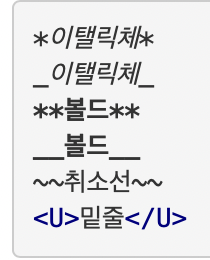
https://sirupe.github.io/first-posting/  

# 10. 그 외 전처리 & 시각화 ing...

### 서울, 인천, 경기 분리중...

In [67]:
seoul_df = place_df[place_df['시도'] == "서울"]
incheon_df = place_df[place_df['시도'] == "인천"]
gyeonggi_df = place_df[place_df['시도'] == "경기"]

### 년일로만 표시 중..
겹치는 부분이 없었기에

In [68]:
seoul_df['일자'] = seoul_df['일자'].astype(str).apply(lambda x : str(x[:6])).astype(int)
incheon_df['일자'] = incheon_df['일자'].astype(str).apply(lambda x : str(x[:6])).astype(int)
gyeonggi_df['일자'] = gyeonggi_df['일자'].astype(str).apply(lambda x : str(x[:6])).astype(int)

### 일자로 index 설정 중...

In [69]:
seoul_df.set_index("일자", inplace= True)
incheon_df.set_index("일자", inplace= True)
gyeonggi_df.set_index("일자", inplace= True)

### 서울 missing data 구분 짓는 중...

In [70]:
seoul_f = seoul_df[seoul_df['시군구'].isnull() == True]
seoul_t = seoul_df[seoul_df['시군구'].isnull() != True]

In [71]:
seoul_f2 = seoul_f.fillna("NaN")

### 시각화 준비중...

In [72]:
cols = ["시군구", "업종"]
units = ["백만원", "백만원", "원", "원", "원"]
titles = ["100만 ~ 700만", "30만 ~ 100만", "10만 ~ 30만", "3만 ~ 10만", "3만"]

In [73]:
plt.rcParams["figure.figsize"] = (16,12)

In [74]:
seoul1 = seoul_df[(seoul_df["금액"] >= 1000000) & (seoul_df["금액"] < 7000000)]["금액"] # 23
seoul2 = seoul_df[(seoul_df["금액"] >= 300000) & (seoul_df["금액"] < 1000000)]["금액"]; # 57
seoul3 = seoul_df[(seoul_df["금액"] >= 100000) & (seoul_df["금액"] < 300000)]["금액"] # 99
seoul4 = seoul_df[(seoul_df["금액"] >= 30000) & (seoul_df["금액"] < 100000)]["금액"] # 106
seoul5 = seoul_df[seoul_df["금액"] < 30000]["금액"]; # 77
seoul_p = [seoul1, seoul2, seoul3, seoul4, seoul5]

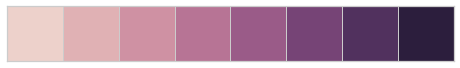

In [75]:
color = sns.palplot(sns.cubehelix_palette(8))
# color = sns.color_palette('pastel')[:]
# color = sns.color_palette('cubehelix', 9)
# color = sns.color_palette('hls', 5)
# color = sns.color_palette('husl', 8)
# color = sns.hls_palette(9, l= .5, s= .45)

seoul_sibu = [seoul_si, seoul_bu]
fig, axes = plt.subplots(1, 2)

for c in range(2):
    seoul_sibu[i].plot(kind= 'pie', 
                       autopct= '%1.1f%%', 
                       figsize= (10, 10), 
                       colors= color,
                      ax= axes[0][i])

# 11. 서울(통합) 시각화 

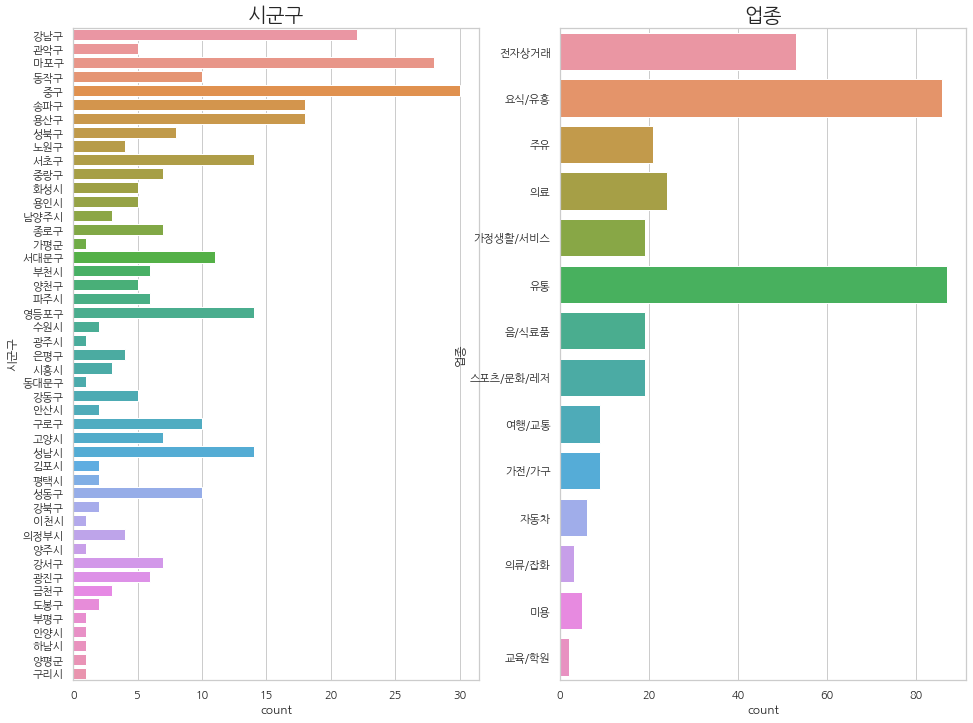

In [76]:
for i in range(2):
    plt.subplot(1, 2, i +1)
    sns.countplot(data= seoul_df, y= cols[i])
    plt.title(cols[i], fontsize= 20);

## 시군구 & 업종

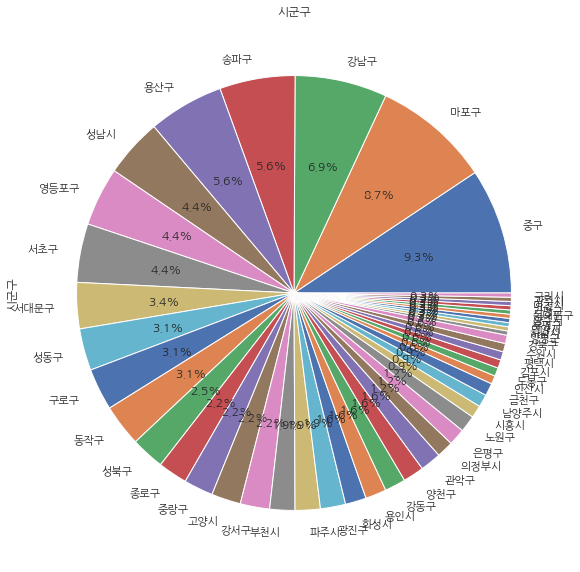

In [77]:
plt.figure(figsize= (10, 10))

seoul_si = seoul_df['시군구'].value_counts()
plt.title("시군구")
seoul_si.plot(kind= 'pie', autopct= '%1.1f%%', colors= color);

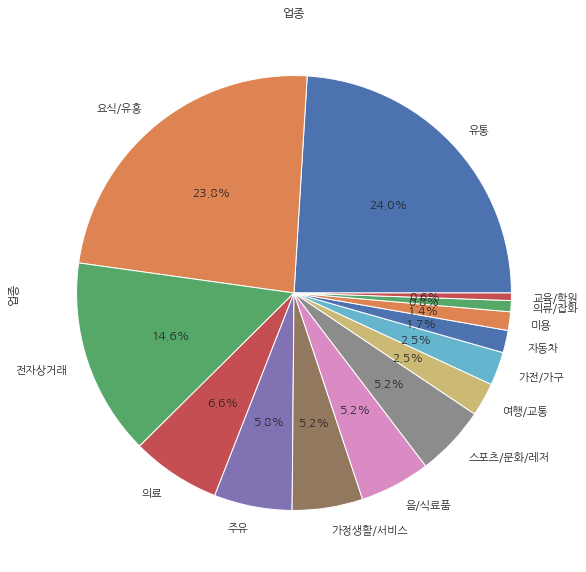

In [78]:
plt.figure(figsize= (10, 10))

seoul_bu = seoul_df['업종'].value_counts()
plt.title("업종")
seoul_bu.plot(kind= 'pie', autopct= '%1.1f%%', colors= color);

## 서울시 카드 결제 %
### 시군구 기준
1. 중구 9.3%
2. 마포구 8.7%
3. 강남구 6.9%

### 업종 기준
1. 유통 24.0%
2. 요식/유흥 23.8%
3. 전자상거래 14.6%

## 금액별 시각화

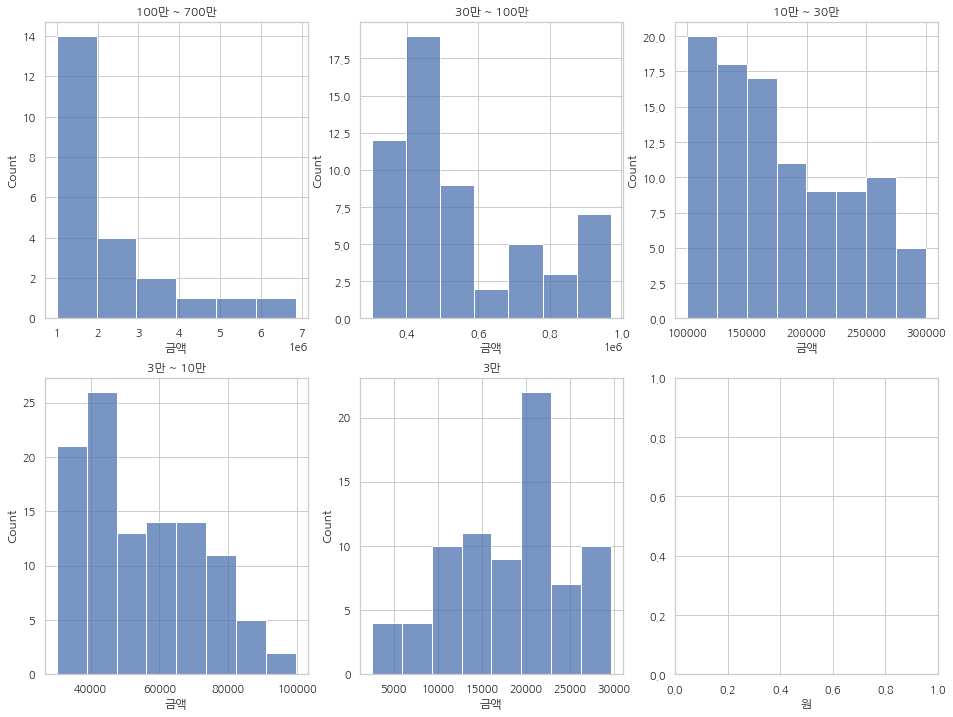

In [79]:
fig, axes = plt.subplots(2, 3)
cnt = 0

for r in range(2):
    for c in range(3):
        sns.histplot(data=seoul_p[cnt] ,ax= axes[r, c])
        plt.gca().set(xlabel= units[cnt]) ####
#         plt.xlabel(units[cnt]) #####
        axes[r, c].set_title(titles[cnt])
        cnt += 1
        if cnt == 5:
            break

#### displot 코드 기원

sns.displot(seoul_df[(seoul_df["금액"] >= 1000000) & (seoul_df["금액"] < 7000000)]["금액"]) # 23  
plt.xlabel("백만원")  
plt.title("100만 ~ 700만")  

sns.displot(seoul_df[(seoul_df["금액"] >= 300000) & (seoul_df["금액"] < 1000000)]["금액"]); # 57
plt.xlabel("백만원")  
plt.title("30만 ~ 100만")  

sns.displot(seoul_df[(seoul_df["금액"] >= 100000) & (seoul_df["금액"] < 300000)]["금액"]) # 99
plt.xlabel("원")  
plt.title("10만 ~ 30만")  

sns.displot(seoul_df[(seoul_df["금액"] >= 30000) & (seoul_df["금액"] < 100000)]["금액"]) # 106
plt.xlabel("원")  
plt.title("3만 ~ 10만")  

sns.displot(seoul_df[seoul_df["금액"] < 30000]["금액"]); # 77
plt.xlabel("원")  
plt.title("3만 미만") 

plt.show()

In [135]:
seoul_df_max = seoul_df[seoul_df["금액"] == 6850860]
seoul_df_mean = seoul_df[(seoul_df["금액"] >= 285000) & (seoul_df["금액"] <= 295000)]
seoul_df_min = seoul_df[seoul_df["금액"] == 2515]

In [136]:
seoul_df_159 = pd.concat([seoul_df_max, seoul_df_mean, seoul_df_min], axis= 0, join= "inner")
seoul_df_159

,시도,시군구,업종,금액,건
일자,,,,,
201702,서울,NaN,유통,6850860,5
201607,서울,마포구,유통,291740,5
201702,서울,평택시,의류/잡화,289175,5
202101,서울,마포구,유통,2515,5


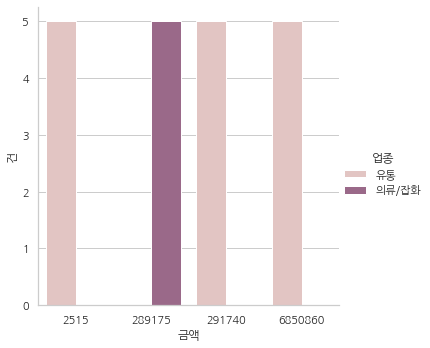

In [148]:
sns.set_palette(sns.cubehelix_palette(n_colors= 3, light= 0.8))


sns.catplot(data= seoul_df_159, x= "금액", y= "건", hue= "업종", kind= "bar");

# displot, plt.subplots 접목 실패...

fig, axes = plt.subplots(1, 2)   
sns.displot(seoul_df[(seoul_df["금액"] >= prices[0]) & (seoul_df["금액"] < prices[1])]["금액"], ax= axes[0])  
plt.xlabel("원");  
sns.displot(seoul_df[(seoul_df["금액"] >= prices[1]) & (seoul_df["금액"] < prices[2])]["금액"], ax= axes[1])  
plt.xlabel("원");  
> 버전이 달라서 sns.displot이  plt.subplots 적용이 안되어.......

In [175]:
sns.__version__

'0.11.2'

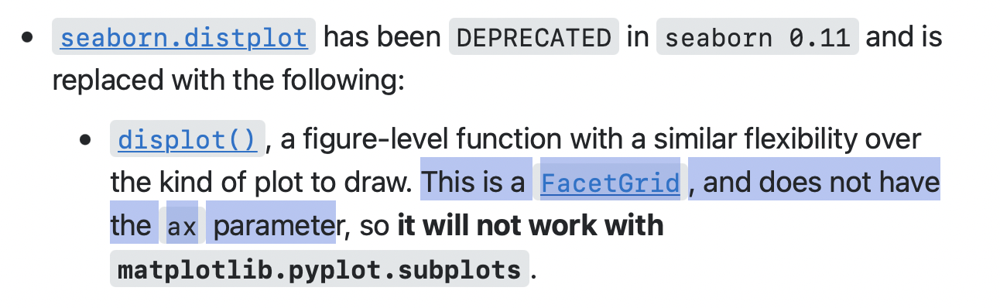  
https://stackoverflow.com/questions/63895392/seaborn-is-not-plotting-within-defined-subplots

지영님 감사드립니다.

### distplot  
-> This function __has been deprecated__ and __will be removed__ in seaborn v0.14.0  
https://seaborn.pydata.org/generated/seaborn.distplot.html?highlight=distplot#seaborn.distplot  

> displot -> without "ax"
>>https://seaborn.pydata.org/generated/seaborn.displot.html#seaborn.displot  

>histplot -> with "ax"
>>https://seaborn.pydata.org/generated/seaborn.histplot.html#seaborn.histplot  

https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751  

갓성돈님 감사드립니다

# 12. 서울(Missing data) 시각화

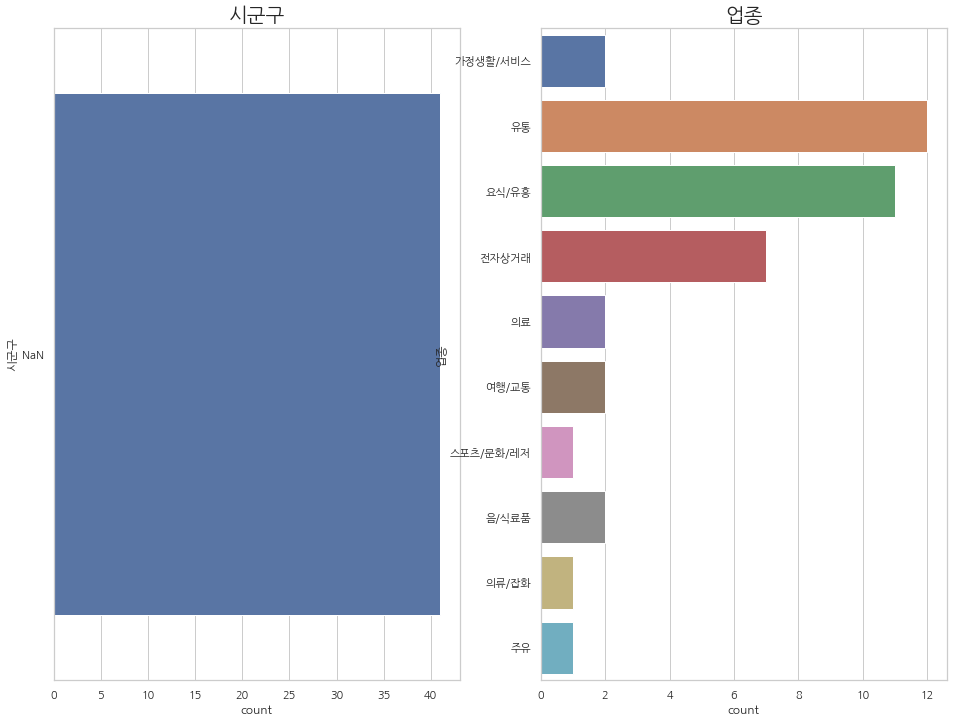

In [80]:
for i in range(2):
    plt.subplot(1, 2, i +1)
    sns.countplot(data= seoul_f2, y= cols[i])
    plt.title(cols[i], fontsize= 20);   

## 시군구 & 업종

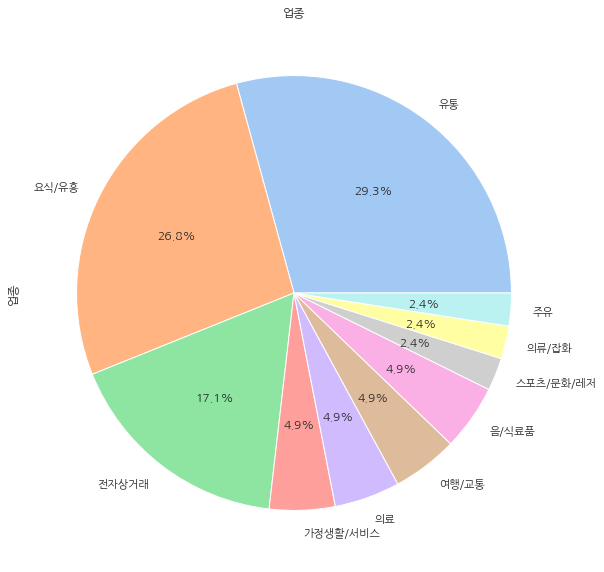

In [81]:
color = sns.color_palette('pastel')[:]
seoul_bu2 = seoul_f2['업종'].value_counts()

plt.figure(figsize= (10, 10))

plt.title("업종")
seoul_bu2.plot(kind= 'pie', autopct= '%1.1f%%', colors= color);

## 서울시(Missing data) 카드 결제 %
### 업종 기준
1. 유통 29.3%
2. 요식/유흥 26.8%
3. 전자상거래 17.1%

## 서울시(Missing data)  금액별 시각화

In [82]:
seoul_ff1 = seoul_f2[(seoul_f2["금액"] >= 1000000) & (seoul_f2["금액"] < 7000000)]["금액"] 
seoul_ff2 = seoul_f2[(seoul_f2["금액"] >= 300000) & (seoul_f2["금액"] < 1000000)]["금액"]
seoul_ff3 = seoul_f2[(seoul_f2["금액"] >= 100000) & (seoul_f2["금액"] < 300000)]["금액"]
seoul_ff4 = seoul_f2[(seoul_f2["금액"] >= 30000) & (seoul_f2["금액"] < 100000)]["금액"]
seoul_ff5 = seoul_f2[seoul_f2["금액"] < 30000]["금액"]
seoul_p2 = [seoul_ff1, seoul_ff2, seoul_ff3, seoul_ff4, seoul_ff5]

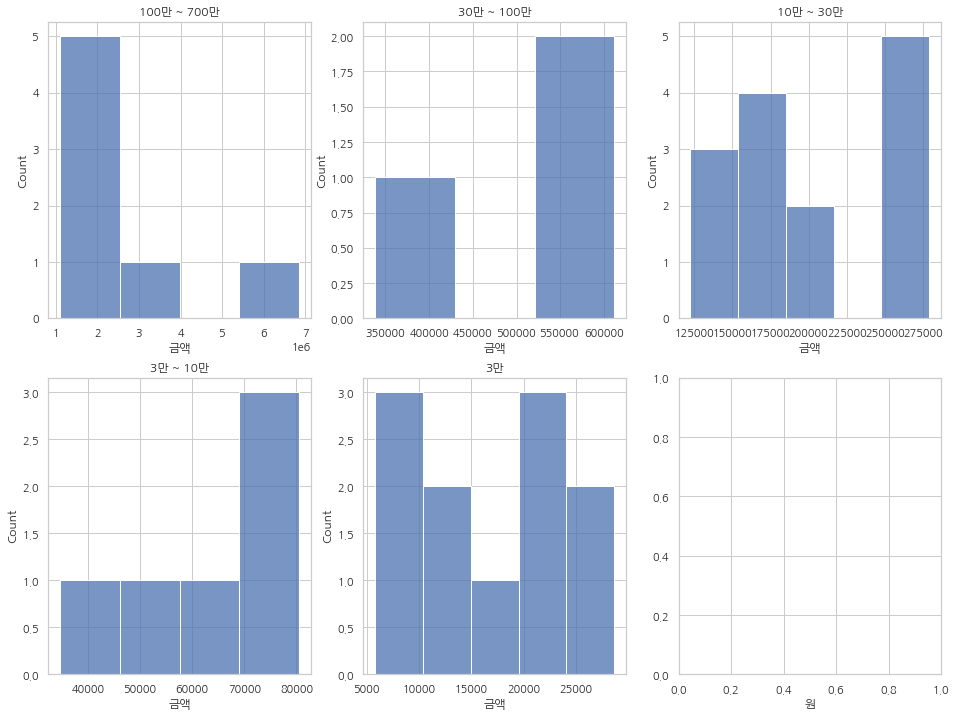

In [83]:
fig, axes = plt.subplots(2, 3)
cnt = 0

for r in range(2):
    for c in range(3):
        sns.histplot(data=seoul_p2[cnt] ,ax= axes[r, c])
        plt.gca().set(xlabel= units[cnt]) ####
#         plt.xlabel(units[cnt]) #####
        axes[r, c].set_title(titles[cnt])
        cnt += 1
        if cnt == 5:
            break

In [125]:
seoul_f2_max = seoul_f2[seoul_f2["금액"] == 6850860]
seoul_f2_mean = seoul_f2[(seoul_f2["금액"] >= 520000) & (seoul_f2["금액"] <= 620000)]
seoul_f2_min = seoul_f2[seoul_f2["금액"] == 5785]

결측치가 있는 서울 데이터 기준으로

In [126]:
seoul_f2_159 = pd.concat([seoul_f2_max, seoul_f2_mean, seoul_f2_min], axis= 0, join= "inner")
seoul_f2_159

,시도,시군구,업종,금액,건
일자,,,,,
201702,서울,NaN,유통,6850860,5
201606,서울,NaN,유통,528150,5
201607,서울,NaN,요식/유흥,611648,5
201610,서울,NaN,의류/잡화,5785,10


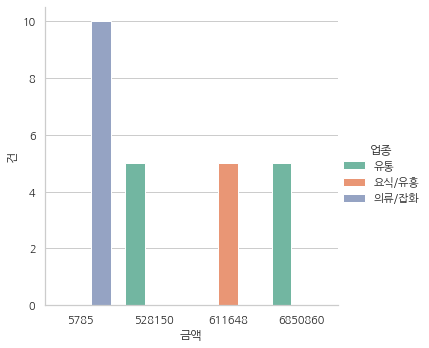

In [143]:
sns.set_palette(sns.color_palette("Set2"))


sns.catplot(data= seoul_f2_159, x= "금액", y= "건", hue= "업종", kind= "bar");

# 13. 서울(not Missing data) 시각화

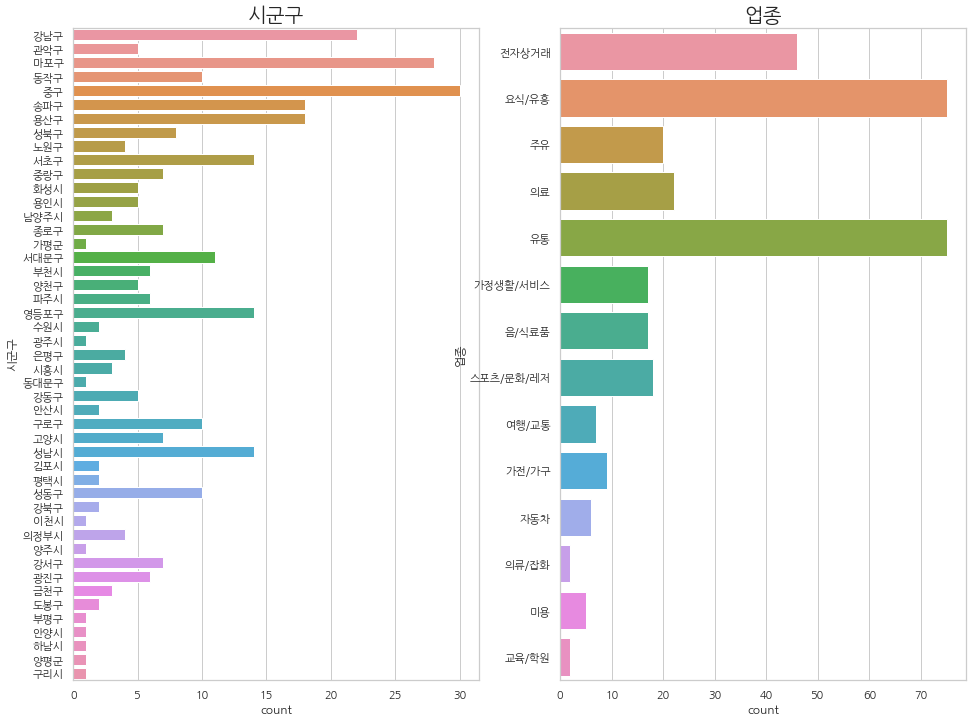

In [84]:
for i in range(2):
    plt.subplot(1, 2, i +1)
    sns.countplot(data= seoul_t, y= cols[i])
    plt.title(cols[i], fontsize= 20)

## 시군구 & 업종

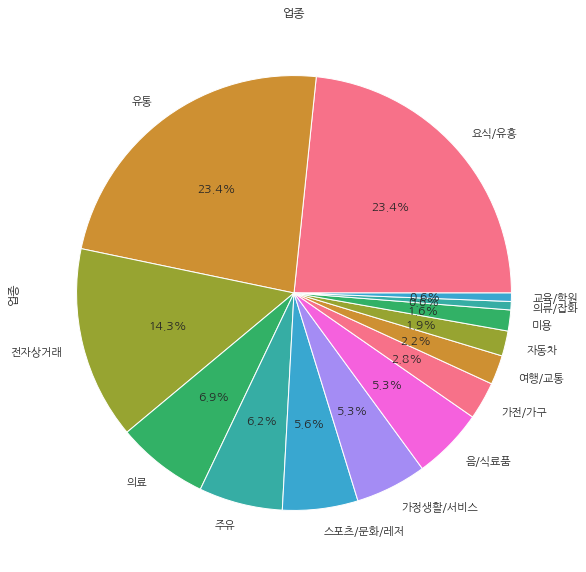

In [85]:
color = sns.color_palette('husl', 8)
seoul_bu3 = seoul_t['업종'].value_counts()

plt.figure(figsize= (10, 10))

plt.title("업종")
seoul_bu3.plot(kind= 'pie', autopct= '%1.1f%%', colors= color);

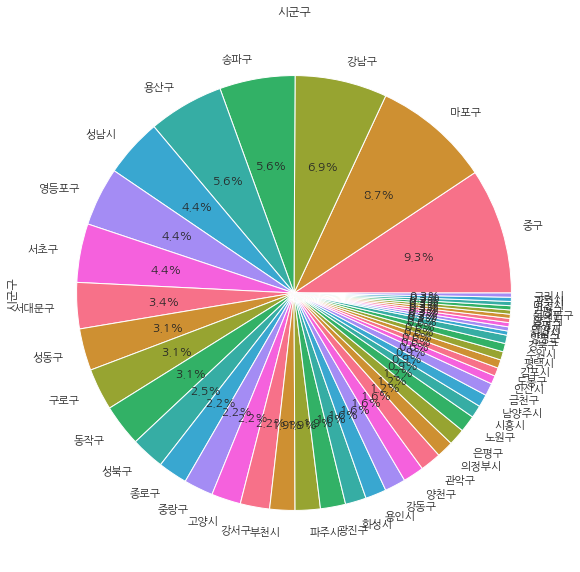

In [86]:
seoul_si3 = seoul_t['시군구'].value_counts()

plt.figure(figsize= (10, 10))

plt.title("시군구")
seoul_si3.plot(kind= 'pie', autopct= '%1.1f%%', colors= color);

# 서울시 카드 결제 % (not Missing data)
### 시군구 기준
1. 중구 9.3%
2. 마포구 8.7%
3. 강남구 6.9%

### 업종 기준
1. 유통, 요식/유흥 23.4%
2. 전자상거래 14.3%

## 서울시(not Missing data)  금액별 시각화

In [87]:
seoul_tt1 = seoul_t[(seoul_t["금액"] >= 1000000) & (seoul_t["금액"] < 7000000)]["금액"] 
seoul_tt2 = seoul_t[(seoul_t["금액"] >= 300000) & (seoul_t["금액"] < 1000000)]["금액"]
seoul_tt3 = seoul_t[(seoul_t["금액"] >= 100000) & (seoul_t["금액"] < 300000)]["금액"]
seoul_tt4 = seoul_t[(seoul_t["금액"] >= 30000) & (seoul_t["금액"] < 100000)]["금액"]
seoul_tt5 = seoul_t[seoul_t["금액"] < 30000]["금액"]
seoul_p3 = [seoul_tt1, seoul_tt2, seoul_tt3, seoul_tt4, seoul_tt5]

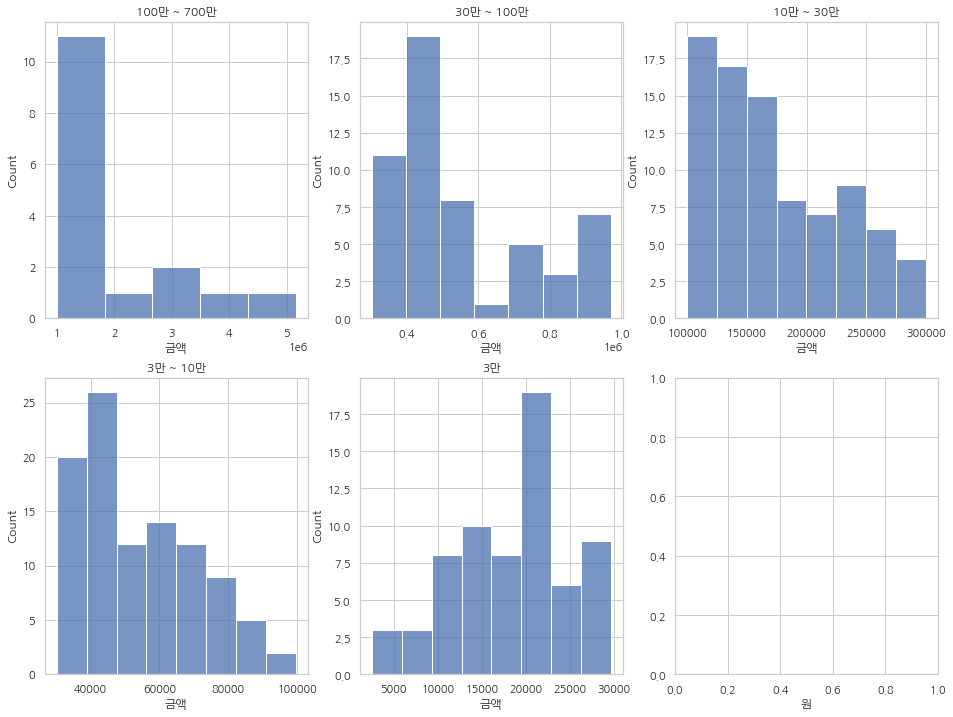

In [88]:
fig, axes = plt.subplots(2, 3)
cnt = 0

for r in range(2):
    for c in range(3):
        sns.histplot(data=seoul_p3[cnt] ,ax= axes[r, c])
        plt.gca().set(xlabel= units[cnt]) ####
#         plt.xlabel(units[cnt]) #####
        axes[r, c].set_title(titles[cnt])
        cnt += 1
        if cnt == 5:
            break

In [117]:
seoul_t_max= seoul_t[seoul_t["금액"] == 5149865]
seoul_t_mean = seoul_t[(seoul_t["금액"] >= 270000) & (seoul_t["금액"] <= 290000)]
seoul_t_min= seoul_t[seoul_t["금액"] == 2515]

In [128]:
seoul_t_159 = pd.concat([seoul_t_max, seoul_t_mean ,seoul_t_min], axis= 0, join= "inner")
seoul_t_159

,시도,시군구,업종,금액,건
일자,,,,,
201601,서울,은평구,요식/유흥,5149865,5
201901,서울,용산구,미용,284698,20
201702,서울,평택시,의류/잡화,289175,5
202101,서울,마포구,유통,2515,5


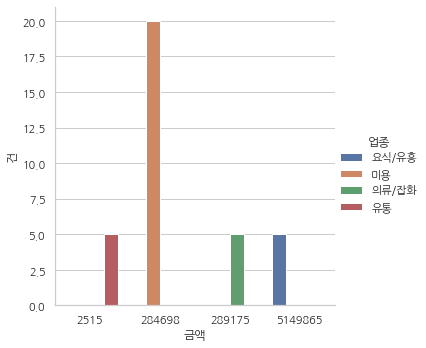

In [129]:
sns.catplot(data= seoul_t_159, x= "금액", y= "건", hue= "업종", kind= "bar");

# 14. 인천 시각화

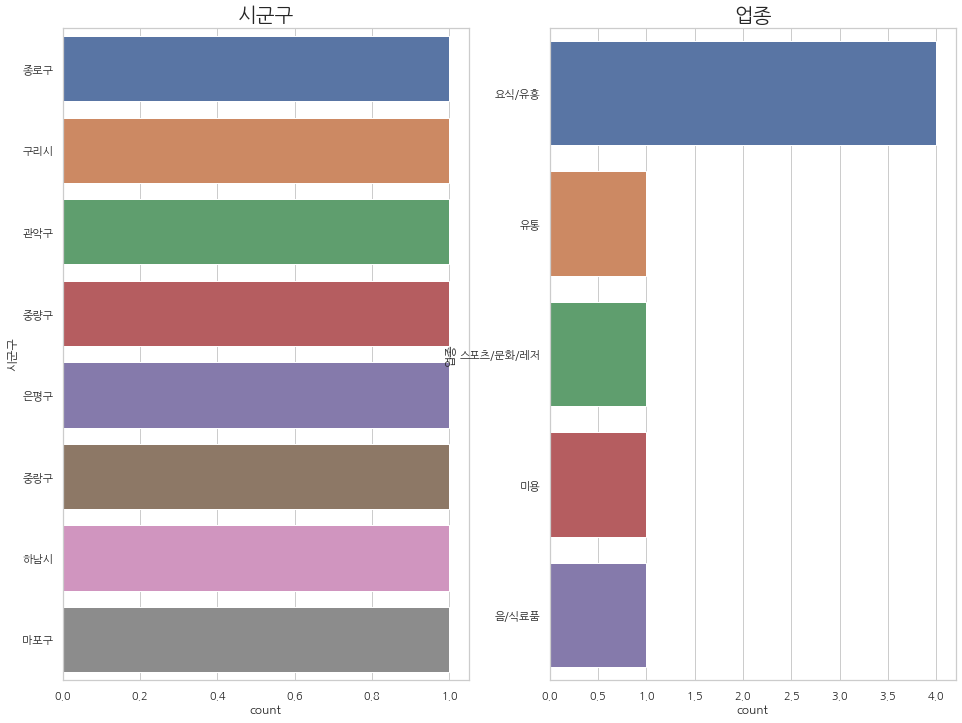

In [89]:
for i in range(2):
    plt.subplot(1, 2, i +1)
    sns.countplot(data= incheon_df, y= cols[i])
    plt.title(cols[i], fontsize= 20);

하....

![NaN감하네요!!^^](https://media.istockphoto.com/id/1212852018/ko/%EB%B2%A1%ED%84%B0/%EB%9C%A8%EA%B1%B0%EC%9A%B4-%EA%B0%90%EC%9E%90-%EB%A7%8C%ED%99%94-%EC%BA%90%EB%A6%AD%ED%84%B0-%EB%A7%88%EC%8A%A4%EC%BD%94%ED%8A%B8.jpg?s=612x612&w=0&k=20&c=2awJJ92oX8_q4xd0U7D4DaZCBSbBiG1guE4rAlH2ly0=)

낚였다. 하.... 이건 아니잖아.... 시군구가 틀리잖아

In [90]:
incheon_r = gyeonggi_df[(gyeonggi_df["시군구"] == "옹진군") | (gyeonggi_df["시군구"] == "강화군")]
incheon_r

,시도,시군구,업종,금액,건
일자,,,,,
202106,경기,옹진군,유통,101757,10
201612,경기,강화군,요식/유흥,19617,5


In [91]:
incheon_r["시도"] = incheon_r["시도"].replace({"경기": "인천"})
incheon_r

,시도,시군구,업종,금액,건
일자,,,,,
202106,인천,옹진군,유통,101757,10
201612,인천,강화군,요식/유흥,19617,5


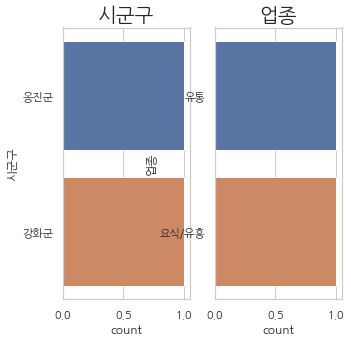

In [92]:
plt.figure(figsize= (5, 5))
for i in range(2):
    plt.subplot(1, 2, i +1)
    sns.countplot(data= incheon_r, y= cols[i])
    plt.title(cols[i], fontsize= 20);

# 인천 카드 결제 건수
### 시군구 기준
1. 옹진군 & 강화군  

### 업종 기준
1. 요식/유흥 & 유통

# 인천 결제 금액별 시각화

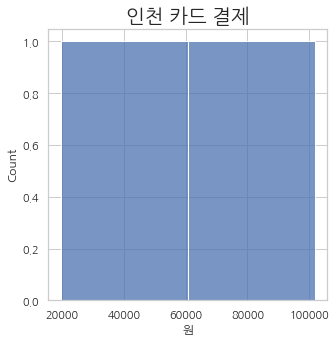

In [93]:
plt.figure(figsize= (5, 5))

sns.histplot(data= incheon_r["금액"])

plt.gca().set(xlabel= "원")
plt.title("인천 카드 결제", fontsize= 20)
plt.show()

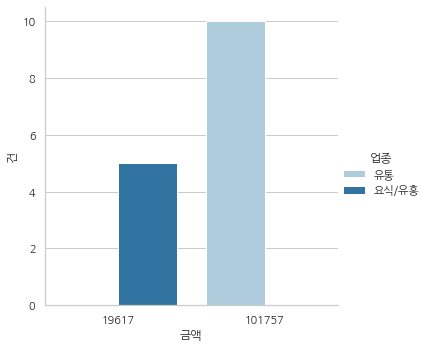

In [142]:
sns.set_palette(sns.color_palette("Paired"))

sns.catplot(data= incheon_r, x= "금액", y= "건", hue= "업종", kind= "bar");

# 15. 경기 시각화

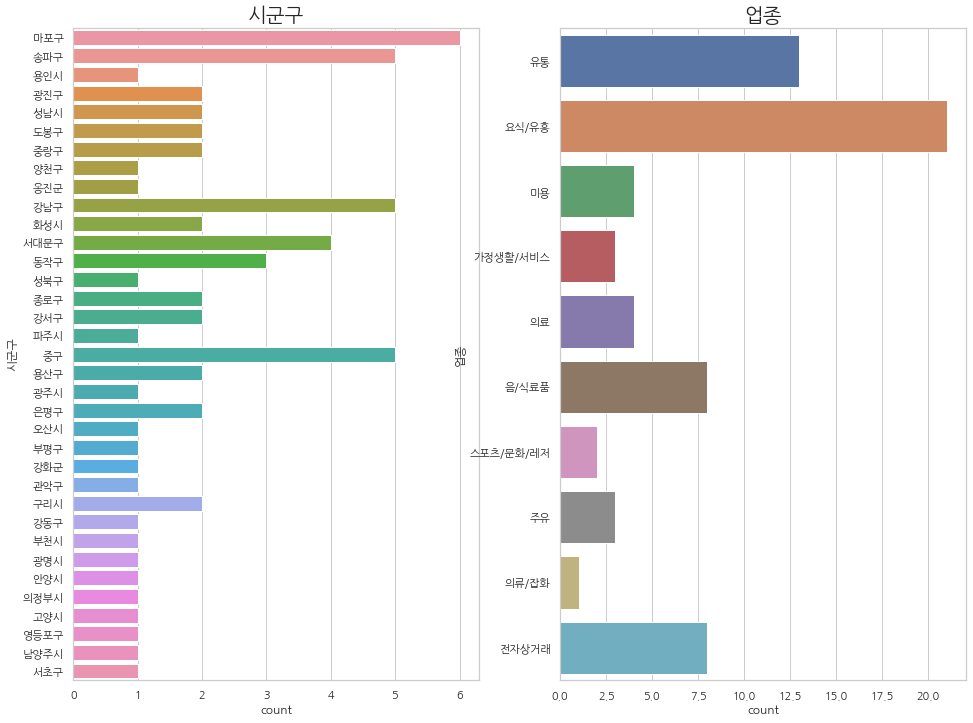

In [94]:
for i in range(2):
    plt.subplot(1, 2, i +1)
    sns.countplot(data= gyeonggi_df, y= cols[i])
    plt.title(cols[i], fontsize= 20);

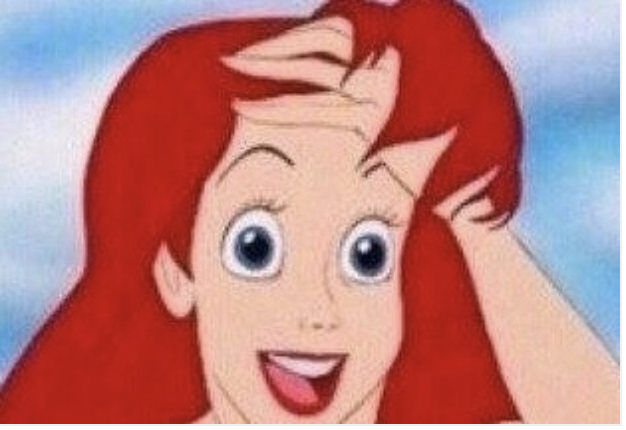

젠장.. 경기도 똑같구먼..

In [95]:
gyeonggi_r = gyeonggi_df[(gyeonggi_df["시군구"] == "용인시") | 
                         (gyeonggi_df["시군구"] == "성남시") |
                         (gyeonggi_df["시군구"] == "화성시") |
                         (gyeonggi_df["시군구"] == "파주시") |
                         (gyeonggi_df["시군구"] == "광주시") |
                         (gyeonggi_df["시군구"] == "오산시") |
                         (gyeonggi_df["시군구"] == "광명시") |
                         (gyeonggi_df["시군구"] == "안양시") |
                         (gyeonggi_df["시군구"] == "의정부시") |
                         (gyeonggi_df["시군구"] == "고양시") |
                         (gyeonggi_df["시군구"] == "남양주시")]

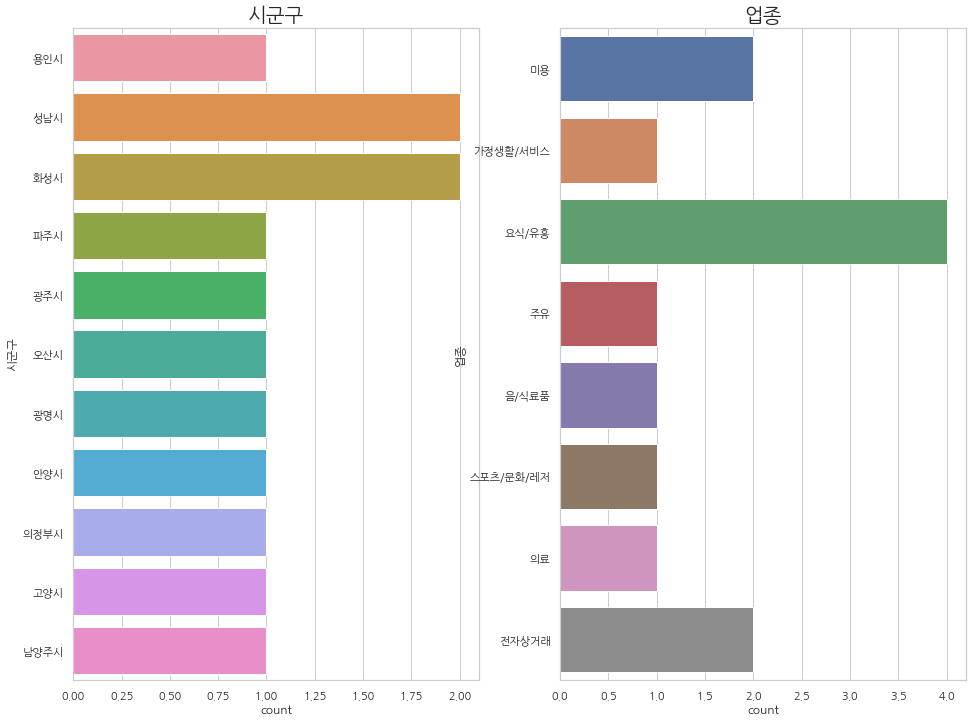

In [96]:
for i in range(2):
    plt.subplot(1, 2, i +1)
    sns.countplot(data= gyeonggi_r, y= cols[i])
    plt.title(cols[i], fontsize= 20);

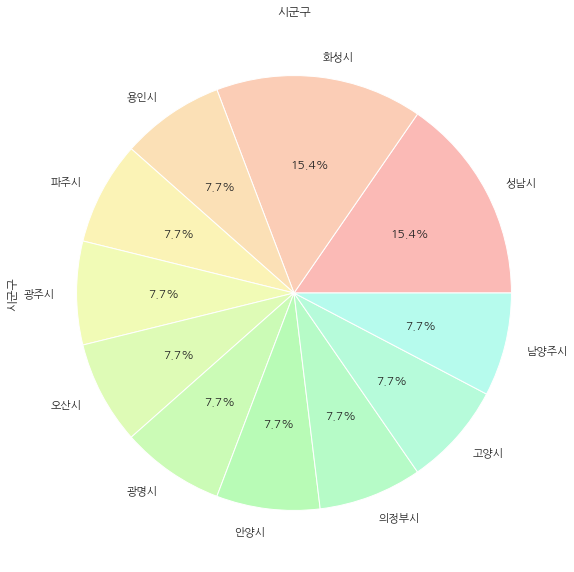

In [97]:
color = sns.hls_palette(22, l= .85, s= .9)
gyeonggi_si = gyeonggi_r['시군구'].value_counts()

plt.figure(figsize= (10, 10))

plt.title("시군구")
gyeonggi_si.plot(kind= 'pie', autopct= '%1.1f%%', colors= color);

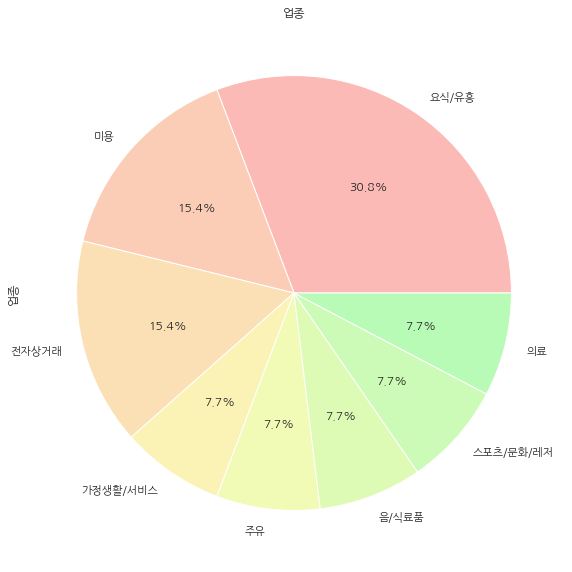

In [98]:
gyeonggi_bu = gyeonggi_r['업종'].value_counts()

plt.figure(figsize= (10, 10))

plt.title("업종")
gyeonggi_bu.plot(kind= 'pie', autopct= '%1.1f%%', colors= color);

# 경기 카드 결제 건수
### 시군구 기준
1. 성남시 & 화성시 15.4%
2. 그 외 7.7%

### 업종 기준
1. 요식/유흥 & 미용 & 업종 15.4%
2. 그 외 7.7%

# 경기도 금액별 시각화

In [99]:
gyeonggi_rr1 = gyeonggi_r[(gyeonggi_r["금액"] >= 1000000) & (gyeonggi_r["금액"] < 5100000)]["금액"] 
gyeonggi_rr2 = gyeonggi_r[(gyeonggi_r["금액"] >= 300000) & (gyeonggi_r["금액"] < 1000000)]["금액"]
gyeonggi_rr3 = gyeonggi_r[(gyeonggi_r["금액"] >= 100000) & (gyeonggi_r["금액"] < 300000)]["금액"]
gyeonggi_rr4 = gyeonggi_r[(gyeonggi_r["금액"] >= 20000) & (gyeonggi_r["금액"] < 100000)]["금액"]
gyeonggi_p = [gyeonggi_rr1, gyeonggi_rr2, gyeonggi_rr3, gyeonggi_rr4]

In [100]:
tit = ["510만 ~ 100만", "30만 ~ 100만", "10만 ~ 30만", "2만 ~ 10만"]

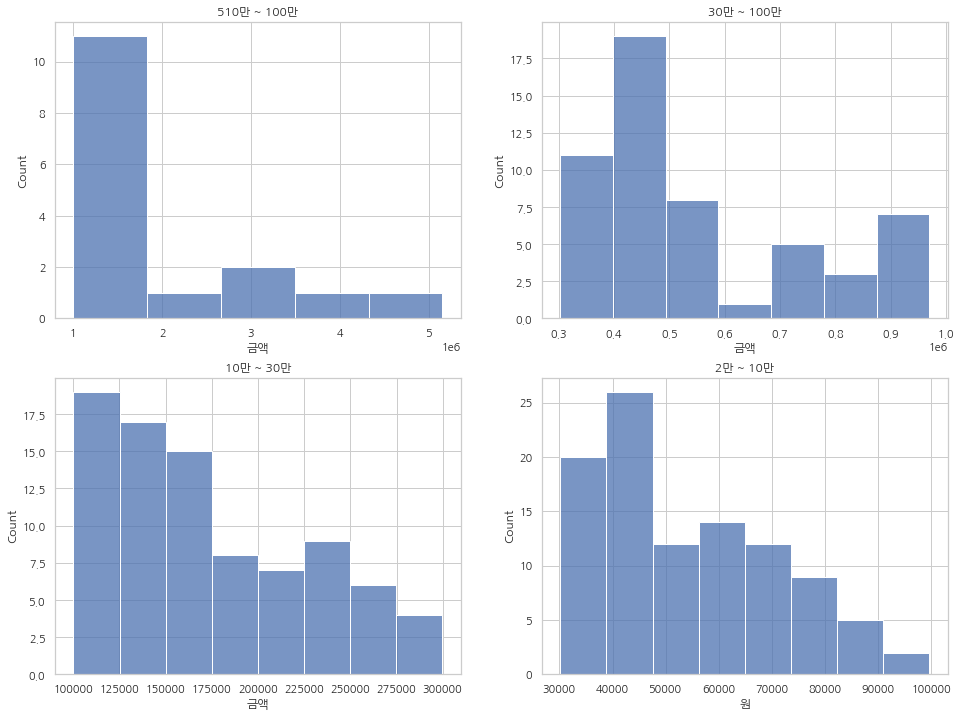

In [101]:
fig, axes = plt.subplots(2, 2)
cnt = 0

for r in range(2):
    for c in range(2):
        sns.histplot(data=seoul_p3[cnt] ,ax= axes[r, c])
        plt.gca().set(xlabel= units[cnt]) ####
#         plt.xlabel(units[cnt]) #####
        axes[r, c].set_title(tit[cnt])
        cnt += 1
        if cnt == 4:
            break

In [102]:
gyeonggi_max = gyeonggi_r[gyeonggi_r["금액"] == 5099414]
gyeonggi_min = gyeonggi_r[gyeonggi_r["금액"] == 23893]
gyeonggi_mean = gyeonggi_r[(gyeonggi_r["금액"] <= 880000) & (gyeonggi_r["금액"] >= 720000)]

In [103]:
gyeonggi_159 = pd.concat([gyeonggi_max,gyeonggi_mean ,gyeonggi_min], axis= 0, join= "inner")
gyeonggi_159

,시도,시군구,업종,금액,건
일자,,,,,
201902,경기,화성시,요식/유흥,5099414,96
202010,경기,용인시,미용,804800,5
202011,경기,안양시,요식/유흥,23893,5


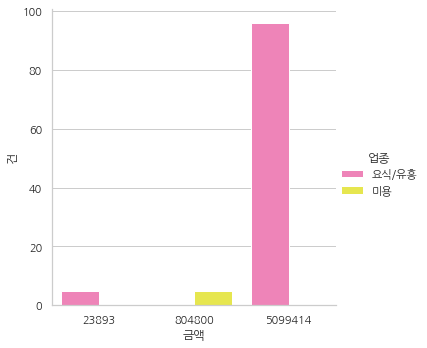

In [140]:
colors = ["#FF73B8", "#FFFF36"]
sns.set_palette(sns.color_palette(colors))

sns.catplot(data= gyeonggi_159, x= "금액", y= "건", hue= "업종", kind= "bar");

# 16. 그 외 데이터들 관련성 확인 

### place_df를 day_df '일자'열을 기준으로 비교 해보니 겹치는 부분이 없네유...
> place_df[place_df["일자"] == 20201021]  
day_df[day_df["기준일자(YMD)"] == 20201021]
>> place_df[(place_df["업종"] == "요식/유흥") & (place_df["일자"] == 20161004)]  
업종 과 일자도 일치 하지 않아요

### hour_df 와 gender_df를 업종 코드 및 년월로 비교해보니 관련 없네유..
>hour_df[(hour_df["서울시민업종코드(UPJONG_CD)"] == "SS017") & (hour_df["기준년월(YM)"] == 201606)]  
gender_df[(gender_df["서울시민업종코드(UPJONG_CD)"] == "SS017") & (gender_df["기준년월(YM)"] == 201606)]

### hour_df 와 pattern_df 관련성이 없네유
>hour_df[hour_df["서울시민업종코드(UPJONG_CD)"] == "SS001"]  
pattern_df[pattern_df["업종코드(UPJONG_CD)"] == "SS001"]

### place_df와 gender_df
관련성이 안보이네유

### place_df 와 pattern_df 관련이 없어유
> place_df[place_df["업종"] == "요식/유흥"]  
pattern_df[pattern_df["대분류(CLASS1)"]== "요식/유흥"]

이정도면 관련 없는 것으로..

관련이 없는 데이터들에  
새로운 feature 생성해보면 관련성이 있을 가능성이 있다.  

수경님 감사드립니다

# 17. 인지해야할 코드 모음

### loc를 통해 특정 열의 해당 값만 데이터 프레임으로로로로
1. kangnam_place = place_df.loc[place_df["가맹점주소시군구(SGG)"] == "강남구"]  
2. mapo_place = place_df.loc[place_df["가맹점주소시군구(SGG)"] == "마포구"]

### Missing data 부분만 데이터 프레임으로로로로
1. place_df[(place_df['시도'] == "경기") & (place_df['시군구'].isnull() == True)]
> place_df['시군구'].isnull() == True  

2. place_df[place_df.isna().any(axis= 1)]

nan 값만 데이터 뽑아서 보아요..  
https://joyful-ugentstudent-note.tistory.com/83?category=539299  
> place_df.loc[place_df["가맹점주소시군구(SGG)"] == np.NaN]  XXXXX

### int 쓸라이이시이잉
data['date'].astype(str).apply(lambda x : str(x[:6])).astype(int)

### columns 이름 바꾸어어어어어
1. df.columns = ["", "", ""]  
2. pattern_df.rename(columns= {"업종코드(UPJONG_CD)": "서울시민업종코드(UPJONG_CD)"}, inplace= True)

### 특정 인덱스 번호로 아무사츠~ 데헷!
place_df = place_df.drop(index= [95, 116, 156, 459, 487])

### max와 idxmax 다르다
gyeonggi_r.max()  
gyeonggi_r.loc[gyeonggi_r['금액'].idxmax()]

# 18. 정리
1. __place_df__ - 일별 카드 결제 소비 지역 데이터 프레임
    1. gender_df - 성별 및 연령대별 카드 소비 패턴  
    2. day_df - 일별 카드 소비 패턴  
    3. hour_df - 시간대별 소액결제 건수의 카드 소비 패턴  
    4. pattern_df - 카드소비 관련된 업종 코드 데이터


2. __서울, 경기, 인천__순으로 카드결제 이용고객이 많다.

> 서울 362건, 약 1억 5백만원  
> 경기 72건, 약 4천만원  
> 인천 9건, 약 450만원  

    a. 서울(통합) 카드 결제  

>시군구 인기순  
>> __중구, 마포구, 강남구__  

>업종 인기순
>> __유통, 요식/유흥, 전자상거래__   

>최대 & 최저 결제금액 업종
>> __유통__업종에서 최대(약 680만원) 및 최저(약 2500원) 금액이 결제가 되었습니다.

    b. 서울(결측치) 카드 결제

> 업종 기준 인기순
>> __유통, 요식/유흥, 전자상거래__  

>최대 & 최저 결제금액 업종
>> __유통__에서 총 5건으로 약 680만원   
__의류/잡화__에서 총 10건으로 약 5800원

    c. 서울(순수) 카드 결제

> 시군구 인기순
>> __중구, 마포구, 강남구__  

>업종 인기순
>>__유통 & 요식/유흥, 전자상거래__ 

> 최대 & 최저 결제금액 업종
>> __은평구의 요식/유흥__ 업종에서 총 5건으로 약 510만원   
__마포구의 유통__ 업종에서 총 5건으로 약 2500원

    d. 인천 카드 결제  
> 시군구 인기순
>> 옹진군 & 강화군

> 업종 인기순
>> 요식/유흥 & 유통

> 최대 & 최저 결제금액 업종
>> __옹진군의 유통__ 에서 총 10건으로 약 10만원  
__강화군의 요식/유흥__ 에서 총 5건으로 약 2만원

    d. 경기 카드 결제 건수
> 시군구 인기순
>> __성남시 & 화성시__  

> 업종 인기순
>> __요식/유흥 & 미용__  

> 최대 & 최저 결제금액 업종
>> __화성시의 요식/유흥__ 에서 총 96건으로 약 510만원  
__안양시의 요식/유흥__ 에서 총 5건으로 약 2만원  

3. 광역시도와 시군구의 매칭이 잘못된 부분이 많다.  
>  결국, 2번에서 언급했던 부분이 잘못 되었다.

# 19. 결론
사업을 하고 싶으면  
__시도 및 시군구에서 업종의 인기순__을 미리 확인하시고  
__Red[Blue] Ocean__인지   
__본인이 경쟁력을 갖춘 상태__인지  
아니면 __경제력 혹은 인맥__을 가지셨는지  
스스로 잘 판단하시길 바랍니다.  
_P.S 투자는 본인 책임。 Investment is your responsibility。 投資はお前の責任!_  

__P.S 갓성돈님께서 다 해주신 덕분에 엑스트라 역할을 충실할 수 있게 되었습니다. 감사드립니다:)__